In [1]:
#pip install geopandas

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import xml.etree.ElementTree as ET
import zipfile
import os

# Load the main dataset (residents with accessibility scores)
residents_df = pd.read_csv("BangaloreScoreV1.csv")

In [2]:
# Helper function to parse KML and return GeoDataFrame
def parse_kml_to_gdf(kml_path, feature_type="Point"):
    # Parse XML from KML
    tree = ET.parse(kml_path)
    root = tree.getroot()

    # Find the namespace
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}

    # Extract names and coordinates
    names = []
    coords = []

    for placemark in root.findall('.//kml:Placemark', namespace):
        name = placemark.find('kml:name', namespace)
        coord = placemark.find('.//kml:coordinates', namespace)
        if name is not None and coord is not None:
            names.append(name.text)
            coord_text = coord.text.strip()
            lon, lat, *_ = map(float, coord_text.split(','))
            coords.append(Point(lon, lat))

    gdf = gpd.GeoDataFrame({'name': names, 'geometry': coords}, crs="EPSG:4326")
    return gdf

# Load facilities
schools_gdf = parse_kml_to_gdf("bbmp-schools-2013.kml")
toilets_gdf = parse_kml_to_gdf("bbmp-toilets.kml")
metro_gdf = parse_kml_to_gdf("bengaluru-metro-stations.kml")

# Create GeoDataFrame for residents
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)


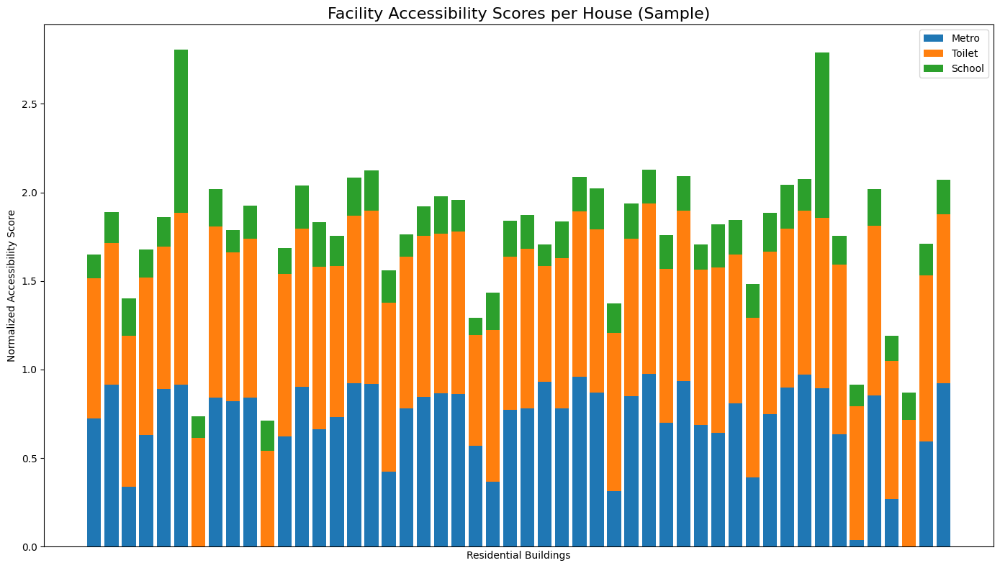

<Figure size 640x480 with 0 Axes>

In [3]:
# Normalize scores for better comparison
from sklearn.preprocessing import MinMaxScaler

score_cols = ['Metro_Score', 'Toilet_Score', 'School_Score']
scaler = MinMaxScaler()
residents_df[['Metro_Score_Norm', 'Toilet_Score_Norm', 'School_Score_Norm']] = scaler.fit_transform(
    residents_df[score_cols])

# Take sample for plotting
sample_residents = residents_df.sample(50, random_state=42)

# Plot stacked bar chart of normalized facility scores
fig, ax = plt.subplots(figsize=(14, 8))

bottom1 = sample_residents['Metro_Score_Norm']
bottom2 = bottom1 + sample_residents['Toilet_Score_Norm']

ax.bar(sample_residents['Building'], sample_residents['Metro_Score_Norm'], label='Metro')
ax.bar(sample_residents['Building'], sample_residents['Toilet_Score_Norm'], bottom=bottom1, label='Toilet')
ax.bar(sample_residents['Building'], sample_residents['School_Score_Norm'], bottom=bottom2, label='School')

ax.set_title('Facility Accessibility Scores per House (Sample)', fontsize=16)
ax.set_xlabel('Residential Buildings')
ax.set_ylabel('Normalized Accessibility Score')
ax.legend()
ax.tick_params(axis='x', which='both', bottom=False, labelbottom=False)  # Hide x labels for clarity

plt.tight_layout()
plt.show()
plt.savefig('BangaloreStack.png')

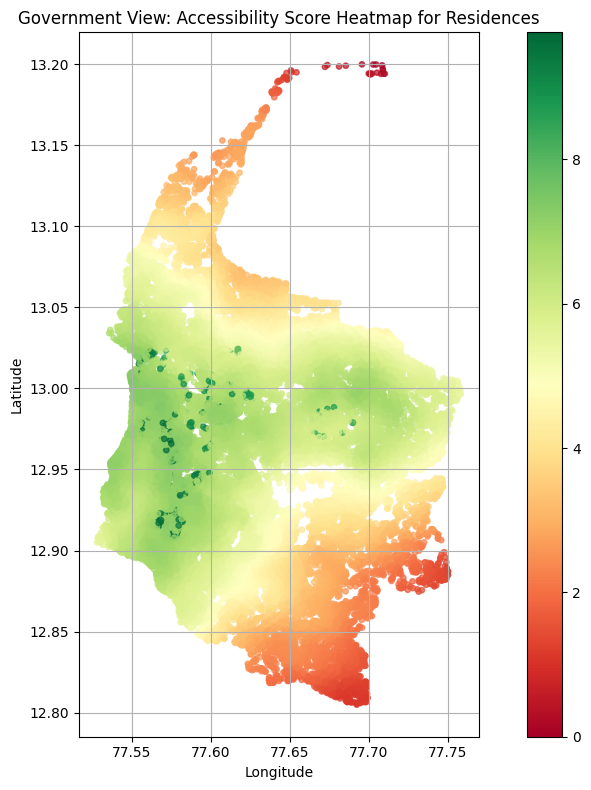

In [4]:
# Calculate a total accessibility score for each residence
residents_gdf['Total_Score'] = (residents_gdf[['Metro_Score', 'Toilet_Score', 'School_Score']].sum(axis=1))/3

# Plot heatmap-like scatter of total scores
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(
    ax=ax,
    column='Total_Score',
    cmap='RdYlGn',
    legend=True,
    markersize=15,
    alpha=0.7
)
plt.title("Government View: Accessibility Score Heatmap for Residences")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


       Total_Score
43578     0.000000
24347     0.067778
465       0.105556
23721     0.115556
40199     0.171111
...            ...
36976     3.510000
35684     3.510000
33751     3.510000
16677     3.510000
4826      3.510000

[5003 rows x 1 columns]


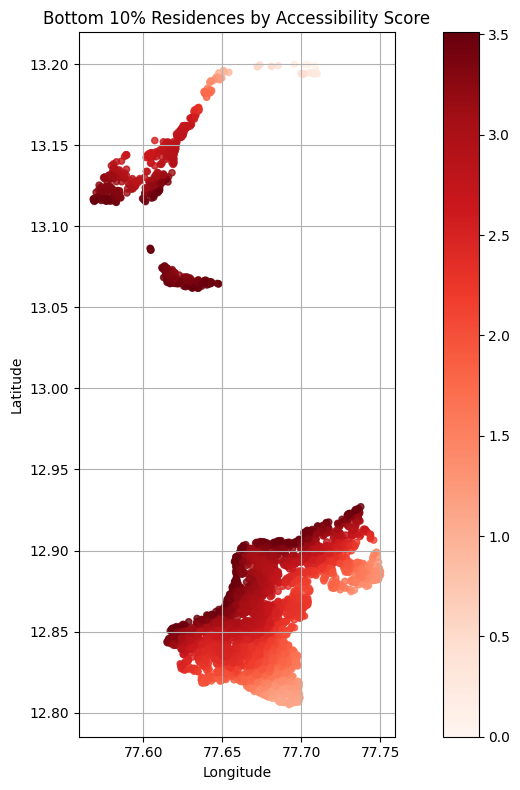

In [5]:
# Step 1: Calculate the 10th percentile threshold
threshold = residents_gdf['Total_Score'].quantile(0.10)

# Step 2: Filter rows with scores at or below the threshold
bottom_10_percent = residents_gdf[residents_gdf['Total_Score'] <= threshold]

# Step 3 (Optional): View the filtered DataFrame
print(bottom_10_percent[['Total_Score']].sort_values(by='Total_Score'))

# Step 4: (Optional) Plot only the bottom 10% scores on a map
fig, ax = plt.subplots(figsize=(10, 8))
bottom_10_percent.plot(
    ax=ax,
    column='Total_Score',
    cmap='Reds',
    legend=True,
    markersize=20,
    alpha=0.8
)
plt.title("Bottom 10% Residences by Accessibility Score")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


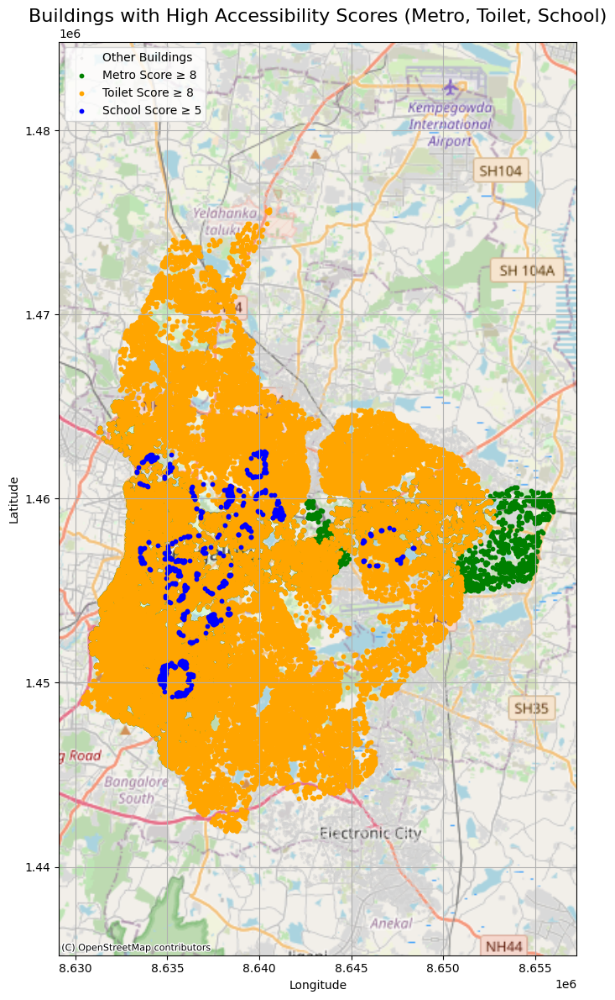

In [6]:
import contextily as ctx

# Plot buildings with high scores for Metro, Toilet, and School facilities

# Define thresholds and styling for the three selected facilities
facility_thresholds = {
    "Metro_Score": {
        "color": "green", 
        "label": "Metro Score ≥ 8", 
        "threshold": 8
    },
    "Toilet_Score": {
        "color": "orange", 
        "label": "Toilet Score ≥ 8", 
        "threshold": 8
    },
    "School_Score": {
        "color": "blue", 
        "label": "School Score ≥ 5", 
        "threshold": 5
    }
}

# Convert to Web Mercator projection (EPSG:3857) for basemap compatibility
residents_web = residents_gdf.to_crs(epsg=3857)

# Initialize plot
fig, ax = plt.subplots(figsize=(14, 12))

# Plot all buildings in light gray
residents_web.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

# Plot high-score buildings for each selected facility
for col, details in facility_thresholds.items():
    if col in residents_web.columns:
        high_score = residents_web[residents_web[col] >= details["threshold"]]
        high_score.plot(
            ax=ax, 
            color=details["color"], 
            markersize=10, 
            label=details["label"]
        )

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Final plot formatting
plt.title("Buildings with High Accessibility Scores (Metro, Toilet, School)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [7]:
from shapely.geometry import Point

# Simulate new facilities being added in underserved areas
new_schools = gpd.GeoDataFrame(geometry=[
    Point(77.56, 13.01), Point(77.58, 13.03), Point(77.62, 12.96)
], crs="EPSG:4326")

new_toilets = gpd.GeoDataFrame(geometry=[
    Point(77.55, 13.00), Point(77.57, 12.98), Point(77.63, 12.95)
], crs="EPSG:4326")

In [8]:
# Combine all existing facilities into a single GeoDataFrame for density analysis
facilities_gdf = pd.concat([schools_gdf, toilets_gdf, metro_gdf], ignore_index=True)
facilities_gdf = facilities_gdf.to_crs(epsg=3857)  # convert to metric projection for density

'''# Create hexbin plot for density
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_title("Urban Planners View: Facility Density Map", fontsize=16)
ax.set_xlabel("Easting")
ax.set_ylabel("Northing")

# Plot hexbin of facility density
x = facilities_gdf.geometry.x
y = facilities_gdf.geometry.y
hb = ax.hexbin(x, y, gridsize=50, cmap='plasma', mincnt=1)
cb = fig.colorbar(hb, ax=ax)
cb.set_label("Number of Facilities per Hex")

plt.tight_layout()
plt.show()
'''

'# Create hexbin plot for density\nfig, ax = plt.subplots(figsize=(10, 8))\nax.set_title("Urban Planners View: Facility Density Map", fontsize=16)\nax.set_xlabel("Easting")\nax.set_ylabel("Northing")\n\n# Plot hexbin of facility density\nx = facilities_gdf.geometry.x\ny = facilities_gdf.geometry.y\nhb = ax.hexbin(x, y, gridsize=50, cmap=\'plasma\', mincnt=1)\ncb = fig.colorbar(hb, ax=ax)\ncb.set_label("Number of Facilities per Hex")\n\nplt.tight_layout()\nplt.show()\n'

In [9]:
#pip install geopy

In [10]:
from geopy.distance import geodesic
import numpy as np

# Select 6 buildings randomly for simulation
selected_residents = residents_gdf.sample(6, random_state=1).copy()

# Define new toilet location (near the selected buildings)
new_facility_location = Point(77.58, 13.00)

# Function to update scores based on proximity (simulate a benefit)
def simulate_score_change(row, new_point, threshold_km=1.0):
    dist = geodesic((row.geometry.y, row.geometry.x), (new_point.y, new_point.x)).km
    if dist < threshold_km:
        return min(row['Toilet_Score'] + (1 - dist / threshold_km) * 2.0, 10.0)  # boost score up to max 10
    return row['Toilet_Score']

# Apply simulation
selected_residents['New_Toilet_Score'] = selected_residents.apply(
    lambda row: simulate_score_change(row, new_facility_location), axis=1)

# Plot before and after scores for the selected buildings
labels = selected_residents['Building']
before_scores = selected_residents['Toilet_Score']
after_scores = selected_residents['New_Toilet_Score']

x = np.arange(len(labels))  # label locations
width = 0.35  # width of the bars



In [11]:
# Plot selected buildings with before/after scores and the new facility on a map

#fig, ax = plt.subplots(figsize=(10, 8))

# Plot base map of all buildings faintly
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, label='Other Buildings', alpha=0.5)

# Plot selected buildings before and after
selected_residents.plot(ax=ax, column='Toilet_Score', cmap='Blues', markersize=80, label='Before', alpha=0.6, legend=True)
selected_residents.plot(ax=ax, column='New_Toilet_Score', cmap='Greens', markersize=40, label='After', alpha=0.8)

# Mark new facility
gpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(ax=ax, color='red', marker='*', markersize=200, label='New Toilet')

# Annotate building IDs
for idx, row in selected_residents.iterrows():
    ax.annotate(row['Building'], xy=(row.geometry.x, row.geometry.y), xytext=(3, 3), textcoords="offset points", fontsize=8)

'''plt.title("Scenario Simulation: Impact of New Toilet on Nearby Buildings")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()'''


'plt.title("Scenario Simulation: Impact of New Toilet on Nearby Buildings")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()'

In [12]:
# Select a cluster of 20 buildings that are geographically close to each other
# We'll use a spatial query by selecting a small bounding box
central_point = Point(77.58, 13.00)
buffer_radius = 0.01  # ~1.1km buffer in degrees

nearby_residents = residents_gdf[residents_gdf.geometry.within(central_point.buffer(buffer_radius))].copy()
nearby_residents = nearby_residents.head(20)

# Simulate Toilet Score improvement for these 20 buildings
nearby_residents['New_Toilet_Score'] = nearby_residents.apply(
    lambda row: simulate_score_change(row, new_facility_location), axis=1)

# Plot Before Image
'''fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
nearby_residents.plot(ax=ax, column='Toilet_Score', cmap='Blues', markersize=80, legend=True)
plt.title("Before: Toilet Accessibility Scores of Nearby Buildings")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot After Image
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
nearby_residents.plot(ax=ax, column='New_Toilet_Score', cmap='Greens', markersize=80, legend=True)
gpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(ax=ax, color='red', marker='*', markersize=200, label='New Toilet')
plt.title("After: Improved Toilet Scores with New Facility Nearby")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()'''


'fig, ax = plt.subplots(figsize=(10, 8))\nresidents_gdf.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.3)\nnearby_residents.plot(ax=ax, column=\'Toilet_Score\', cmap=\'Blues\', markersize=80, legend=True)\nplt.title("Before: Toilet Accessibility Scores of Nearby Buildings")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot After Image\nfig, ax = plt.subplots(figsize=(10, 8))\nresidents_gdf.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.3)\nnearby_residents.plot(ax=ax, column=\'New_Toilet_Score\', cmap=\'Greens\', markersize=80, legend=True)\ngpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(ax=ax, color=\'red\', marker=\'*\', markersize=200, label=\'New Toilet\')\nplt.title("After: Improved Toilet Scores with New Facility Nearby")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.grid(True)\nplt.legend()\nplt.tight_layout()\nplt.show()'

In [13]:
# Simulate a Bangalore-wide scenario where multiple new facilities are added and visualize the improvement
from shapely.geometry import MultiPoint

# Define new facilities to simulate added infrastructure
new_facilities = gpd.GeoDataFrame({
    'name': ['New School', 'New Toilet', 'New Metro'],
    'type': ['School', 'Toilet', 'Metro'],
    'geometry': [
        Point(77.60, 12.97),
        Point(77.62, 13.01),
        Point(77.58, 12.92)
    ]
}, crs="EPSG:4326")

# Simulate a boost in score if within ~1.2 km (0.012 deg)
def apply_global_score_boost(row, facility_point, column_name, max_boost=1.5, threshold_km=1.2):
    distance = geodesic((row.geometry.y, row.geometry.x), (facility_point.y, facility_point.x)).km
    if distance < threshold_km:
        return min(row[column_name] + (1 - distance / threshold_km) * max_boost, 10.0)
    return row[column_name]

# Create a copy and simulate score increases
bangalore_scenario = residents_gdf.copy()
bangalore_scenario['Metro_Score_New'] = bangalore_scenario.apply(
    lambda r: apply_global_score_boost(r, new_facilities.loc[2, 'geometry'], 'Metro_Score'), axis=1)
bangalore_scenario['Toilet_Score_New'] = bangalore_scenario.apply(
    lambda r: apply_global_score_boost(r, new_facilities.loc[1, 'geometry'], 'Toilet_Score'), axis=1)
bangalore_scenario['School_Score_New'] = bangalore_scenario.apply(
    lambda r: apply_global_score_boost(r, new_facilities.loc[0, 'geometry'], 'School_Score'), axis=1)

# Plot the BEFORE scenario
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("Original Metro Accessibility Scores - Bangalore")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the AFTER scenario
fig, ax = plt.subplots(figsize=(12, 10))
bangalore_scenario.plot(ax=ax, column='Metro_Score_New', cmap='Greens', markersize=10, legend=True, alpha=0.7)
new_facilities[new_facilities.type == 'Metro'].plot(ax=ax, color='red', marker='*', markersize=200, label='New Metro')
plt.title("Scenario Simulation: Improved Metro Accessibility with New Station")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Metro_Score\', cmap=\'Blues\', markersize=10, legend=True, alpha=0.7)\nplt.title("Original Metro Accessibility Scores - Bangalore")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot the AFTER scenario\nfig, ax = plt.subplots(figsize=(12, 10))\nbangalore_scenario.plot(ax=ax, column=\'Metro_Score_New\', cmap=\'Greens\', markersize=10, legend=True, alpha=0.7)\nnew_facilities[new_facilities.type == \'Metro\'].plot(ax=ax, color=\'red\', marker=\'*\', markersize=200, label=\'New Metro\')\nplt.title("Scenario Simulation: Improved Metro Accessibility with New Station")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [14]:
# Ensure new facilities GeoDataFrame has valid geometries and matching CRS
new_facilities_valid = new_facilities.to_crs(residents_gdf.crs)

# Filter only Metro facility
new_metro_gdf = new_facilities_valid[new_facilities_valid['type'] == 'Metro']

# Re-plot the AFTER map showing improved Metro scores and new facility location
#fig, ax = plt.subplots(figsize=(12, 10))
bangalore_scenario.plot(ax=ax, column='Metro_Score_New', cmap='Greens', markersize=10, legend=True, alpha=0.7)
new_metro_gdf.plot(ax=ax, color='red', marker='*', markersize=200, label='New Metro Station')

'''plt.title("Scenario Simulation: Improved Metro Scores Across Bangalore")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()'''


'plt.title("Scenario Simulation: Improved Metro Scores Across Bangalore")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()'

In [15]:
from sklearn.neighbors import KernelDensity
from scipy.ndimage import gaussian_filter
from matplotlib.colors import Normalize
import numpy as np

# Step 1: Identify low-score areas for Metro (e.g., bottom 10th percentile)
threshold = residents_gdf['Metro_Score'].quantile(0.1)
low_score_residents = residents_gdf[residents_gdf['Metro_Score'] <= threshold]

# Step 2: Use Kernel Density Estimation (KDE) to locate clusters of low-score points
# Convert lat/lon to numpy array for KDE
xy = np.vstack([low_score_residents.geometry.x, low_score_residents.geometry.y]).T

# Apply KDE
kde = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde.fit(xy)
densities = kde.score_samples(xy)

# Get top 5 density locations (potential metro installation points)
low_score_residents['density'] = densities
top_locations = low_score_residents.sort_values('density', ascending=False).head(5)

# Convert to GeoDataFrame
new_metro_points = gpd.GeoDataFrame(geometry=top_locations.geometry, crs="EPSG:4326")
new_metro_points['name'] = [f'Proposed Metro {i+1}' for i in range(len(new_metro_points))]

# Step 3: Simulate improved scores across Bangalore
bangalore_scenario_multi = residents_gdf.copy()

def boost_from_multiple(row, points, column_name, max_boost=1.5, threshold_km=1.2):
    base = row[column_name]
    for pt in points.geometry:
        dist = geodesic((row.geometry.y, row.geometry.x), (pt.y, pt.x)).km
        if dist < threshold_km:
            base = min(base + (1 - dist / threshold_km) * max_boost, 10.0)
    return base

bangalore_scenario_multi['Metro_Score_Improved'] = bangalore_scenario_multi.apply(
    lambda r: boost_from_multiple(r, new_metro_points, 'Metro_Score'), axis=1)

# Step 4: Plot the improved scores with proposed metro locations
'''fig, ax = plt.subplots(figsize=(12, 10))
bangalore_scenario_multi.plot(ax=ax, column='Metro_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.8)
new_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Station')

plt.title("Scenario Analysis: Installing Metro Stations in Low-Score Areas")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


'fig, ax = plt.subplots(figsize=(12, 10))\nbangalore_scenario_multi.plot(ax=ax, column=\'Metro_Score_Improved\', cmap=\'YlGn\', markersize=10, legend=True, alpha=0.8)\nnew_metro_points.plot(ax=ax, color=\'red\', marker=\'*\', markersize=150, label=\'Proposed Metro Station\')\n\nplt.title("Scenario Analysis: Installing Metro Stations in Low-Score Areas")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [16]:
from geopy.distance import distance as geopy_distance
from tqdm import tqdm

# Convert proposed metro locations to lat/lon tuples
proposed_coords = [(pt.y, pt.x) for pt in new_metro_points.geometry]

# Vectorized improvement calculation: precompute all resident-to-station distances
def compute_score_boosts_vectorized(residents_gdf, proposed_coords, original_col='Metro_Score',
                                    new_col='Metro_Score_Improved', max_boost=1.5, threshold_km=1.2):
    improved_scores = []
    for idx, row in tqdm(residents_gdf.iterrows(), total=len(residents_gdf)):
        base_score = row[original_col]
        latlon = (row.geometry.y, row.geometry.x)
        for metro in proposed_coords:
            dist_km = geopy_distance(latlon, metro).km
            if dist_km < threshold_km:
                boost = (1 - dist_km / threshold_km) * max_boost
                base_score = min(base_score + boost, 10.0)
        improved_scores.append(base_score)
    residents_gdf[new_col] = improved_scores
    return residents_gdf

# Apply optimized scoring
bangalore_optimized = compute_score_boosts_vectorized(residents_gdf.copy(), proposed_coords)

# Plot the results
'''fig, ax = plt.subplots(figsize=(12, 10))
bangalore_optimized.plot(ax=ax, column='Metro_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.8)
new_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Stations')

plt.title("City-wide Simulation: Metro Score Improvement with Proposed Stations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [01:29<00:00, 557.06it/s]


'fig, ax = plt.subplots(figsize=(12, 10))\nbangalore_optimized.plot(ax=ax, column=\'Metro_Score_Improved\', cmap=\'YlGn\', markersize=10, legend=True, alpha=0.8)\nnew_metro_points.plot(ax=ax, color=\'red\', marker=\'*\', markersize=150, label=\'Proposed Metro Stations\')\n\nplt.title("City-wide Simulation: Metro Score Improvement with Proposed Stations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [17]:
from shapely.ops import nearest_points
from shapely.geometry import Point
import numpy as np
from geopy.distance import great_circle

# Optimization using NumPy: precompute distances from all residences to new metro points
res_coords = np.array([(pt.y, pt.x) for pt in residents_gdf.geometry])
new_metro_coords = np.array([(pt.y, pt.x) for pt in new_metro_points.geometry])

# Function to calculate great-circle distance between arrays of coordinates
def compute_min_distances(res_coords, facility_coords):
    min_distances = []
    for res in res_coords:
        dists = [great_circle(res, fac).km for fac in facility_coords]
        min_distances.append(min(dists))
    return np.array(min_distances)

# Compute distances and simulate boost
min_dists = compute_min_distances(res_coords, new_metro_coords)
score_boost = np.clip((1 - min_dists / 1.2) * 1.5, 0, None)  # Boost decays over 1.2 km
improved_scores = np.clip(residents_gdf['Metro_Score'] + score_boost, 0, 10)

# Add to GeoDataFrame
residents_gdf['Metro_Score_Improved'] = improved_scores

# Plot the improved metro accessibility scores
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.7)
new_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Station')
plt.title("Optimized Scenario: City-Wide Metro Score Improvement with New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Metro_Score_Improved\', cmap=\'YlGn\', markersize=10, legend=True, alpha=0.7)\nnew_metro_points.plot(ax=ax, color=\'red\', marker=\'*\', markersize=150, label=\'Proposed Metro Station\')\nplt.title("Optimized Scenario: City-Wide Metro Score Improvement with New Installations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [18]:
# Select top 15 densest low-score locations for new metro stations
top15_locations = low_score_residents.sort_values('density', ascending=False).head(15)
top15_metro_points = gpd.GeoDataFrame(geometry=top15_locations.geometry, crs="EPSG:4326")
top15_metro_points['name'] = [f'Proposed Metro {i+1}' for i in range(len(top15_metro_points))]

# Compute optimized distances and score improvements for all buildings in Bangalore
top15_coords = np.array([(pt.y, pt.x) for pt in top15_metro_points.geometry])
min_dists_15 = compute_min_distances(res_coords, top15_coords)
score_boost_15 = np.clip((1 - min_dists_15 / 1.2) * 1.5, 0, None)
improved_scores_15 = np.clip(residents_gdf['Metro_Score'] + score_boost_15, 0, 10)

# Store scores in dataframe for comparison
residents_gdf['Metro_Score_Improved_15'] = improved_scores_15

# Plot comparison: BEFORE
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("BEFORE: Original Metro Accessibility Scores - Bangalore")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot comparison: AFTER
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score_Improved_15', cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Stations')
plt.title("AFTER: Metro Scores After Installing 15 New Stations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Metro_Score\', cmap=\'Blues\', markersize=10, legend=True, alpha=0.7)\nplt.title("BEFORE: Original Metro Accessibility Scores - Bangalore")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot comparison: AFTER\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Metro_Score_Improved_15\', cmap=\'Greens\', markersize=10, legend=True, alpha=0.7)\ntop15_metro_points.plot(ax=ax, color=\'red\', marker=\'*\', markersize=150, label=\'Proposed Metro Stations\')\nplt.title("AFTER: Metro Scores After Installing 15 New Stations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [19]:
# Choose score column and labels for simulation (now for Schools)
target_column = 'School_Score'
boost_column = 'School_Score_Improved_15'
title_before = "BEFORE: Original School Accessibility Scores - Bangalore"
title_after = "AFTER: School Scores After Installing 15 New Schools"

# Identify low-scoring residents
threshold_school = residents_gdf[target_column].quantile(0.1)
low_score_residents_school = residents_gdf[residents_gdf[target_column] <= threshold_school].copy()

# KDE density on low-score points
xy_school = np.vstack([low_score_residents_school.geometry.x, low_score_residents_school.geometry.y]).T
kde_school = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde_school.fit(xy_school)
densities_school = kde_school.score_samples(xy_school)
low_score_residents_school['density'] = densities_school

# Select 15 high-density spots for new schools
top15_school_locations = low_score_residents_school.sort_values('density', ascending=False).head(15)
top15_school_points = gpd.GeoDataFrame(geometry=top15_school_locations.geometry, crs="EPSG:4326")
top15_school_points['name'] = [f'Proposed School {i+1}' for i in range(len(top15_school_points))]

# Compute distances and simulate improvement
top15_school_coords = np.array([(pt.y, pt.x) for pt in top15_school_points.geometry])
min_dists_school = compute_min_distances(res_coords, top15_school_coords)
score_boost_school = np.clip((1 - min_dists_school / 1.2) * 1.5, 0, None)
improved_scores_school = np.clip(residents_gdf[target_column] + score_boost_school, 0, 10)

# Save to dataframe
residents_gdf[boost_column] = improved_scores_school

# Plot BEFORE
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column=target_column, cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title(title_before)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column=boost_column, cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_school_points.plot(ax=ax, color='orange', marker='*', markersize=150, label='Proposed Schools')
plt.title(title_after)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()'''


'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=target_column, cmap=\'Blues\', markersize=10, legend=True, alpha=0.7)\nplt.title(title_before)\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot AFTER\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=boost_column, cmap=\'Greens\', markersize=10, legend=True, alpha=0.7)\ntop15_school_points.plot(ax=ax, color=\'orange\', marker=\'*\', markersize=150, label=\'Proposed Schools\')\nplt.title(title_after)\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()'

In [20]:
# Fix: Select diverse locations by removing duplicates and clustering less densely
# We'll group by rounded coordinates to ensure geographic diversity

# Round coordinates to force spatial diversity (~1.2km bins)
low_score_residents_school['lat_bin'] = low_score_residents_school.geometry.y.round(2)
low_score_residents_school['lon_bin'] = low_score_residents_school.geometry.x.round(2)

# Drop duplicates within these bins
diverse_school_points = low_score_residents_school.drop_duplicates(subset=['lat_bin', 'lon_bin'])
top15_school_locations_diverse = diverse_school_points.sort_values('density', ascending=False).head(15)

# Convert to GeoDataFrame
top15_school_points_diverse = gpd.GeoDataFrame(geometry=top15_school_locations_diverse.geometry, crs="EPSG:4326")
top15_school_points_diverse['name'] = [f'Proposed School {i+1}' for i in range(len(top15_school_points_diverse))]

# Recalculate school score improvements
top15_school_coords_diverse = np.array([(pt.y, pt.x) for pt in top15_school_points_diverse.geometry])
min_dists_school_diverse = compute_min_distances(res_coords, top15_school_coords_diverse)
score_boost_school_diverse = np.clip((1 - min_dists_school_diverse / 1.2) * 1.5, 0, None)
improved_scores_school_diverse = np.clip(residents_gdf['School_Score'] + score_boost_school_diverse, 0, 10)

# Update dataframe
residents_gdf['School_Score_Improved_15_Diverse'] = improved_scores_school_diverse

# Plot BEFORE
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("BEFORE: Original School Accessibility Scores - Bangalore")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER with DIVERSE placements
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score_Improved_15_Diverse', cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_school_points_diverse.plot(ax=ax, color='orange', marker='*', markersize=150, label='Proposed Schools (Diverse)')
plt.title("AFTER: Improved School Scores with Diversely Placed New Schools")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'School_Score\', cmap=\'Blues\', markersize=10, legend=True, alpha=0.7)\nplt.title("BEFORE: Original School Accessibility Scores - Bangalore")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot AFTER with DIVERSE placements\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'School_Score_Improved_15_Diverse\', cmap=\'Greens\', markersize=10, legend=True, alpha=0.7)\ntop15_school_points_diverse.plot(ax=ax, color=\'orange\', marker=\'*\', markersize=150, label=\'Proposed Schools (Diverse)\')\nplt.title("AFTER: Improved School Scores with Diversely Placed New Schools")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

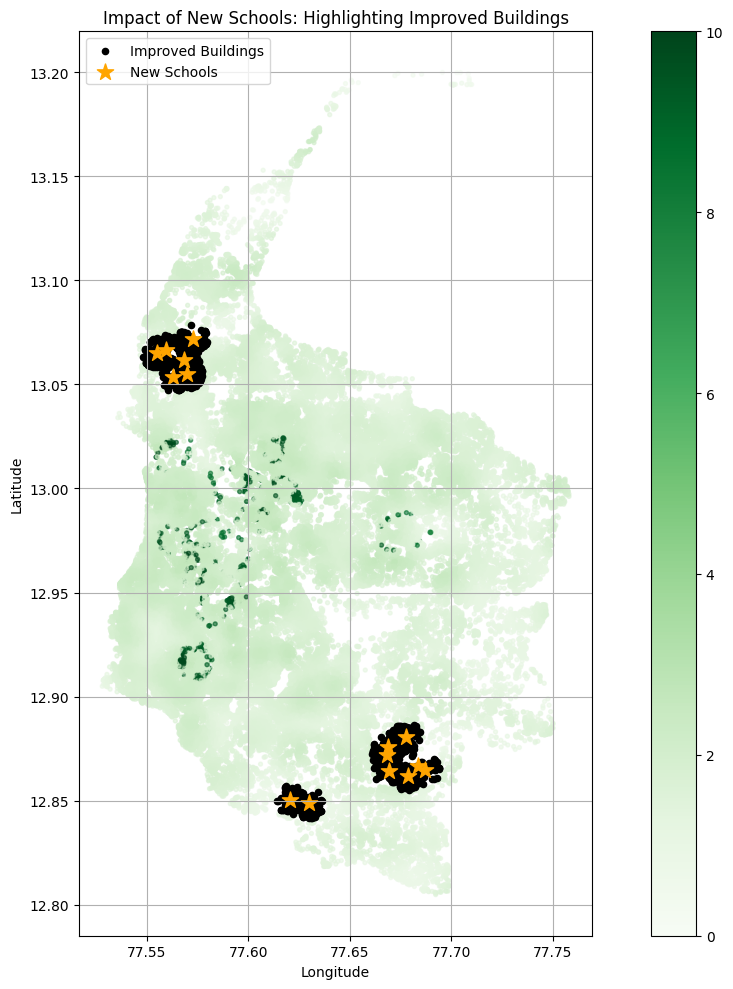

In [21]:
# We'll mark buildings that have improved significantly (boost > 0.5) and are near any new school (within 1.2km)
threshold_km = 1.2
improved_mask = score_boost_school_diverse > 0.5

# Compute distances to each new school for all buildings and find those within the threshold
def is_near_any_school(row, school_points, threshold_km=1.2):
    return any(geodesic((row.geometry.y, row.geometry.x), (pt.y, pt.x)).km < threshold_km
               for pt in school_points.geometry)

residents_gdf['Near_New_School'] = residents_gdf.apply(
    lambda row: is_near_any_school(row, top15_school_points_diverse), axis=1)

# Filter residents that both improved and are near new schools
highlight_residents = residents_gdf[improved_mask & residents_gdf['Near_New_School']]

# Plot after-scenario with highlighted improved buildings
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score_Improved_15_Diverse', cmap='Greens', markersize=8, alpha=0.6, legend=True)
highlight_residents.plot(ax=ax, color='black', marker='o', markersize=20, label='Improved Buildings')
top15_school_points_diverse.plot(ax=ax, color='orange', marker='*', markersize=150, label='New Schools')

plt.title("Impact of New Schools: Highlighting Improved Buildings")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [22]:
# Use vectorized distance-based filtering to highlight improved buildings near new schools

# Coordinates: residents and new school points
school_coords = np.array([(pt.y, pt.x) for pt in top15_school_points_diverse.geometry])

# Function to find if a resident is within 1.2km of any school
def compute_nearby_flags(res_coords, facility_coords, threshold_km):
    near_flags = []
    for res in res_coords:
        distances = [great_circle(res, fac).km for fac in facility_coords]
        near_flags.append(min(distances) < threshold_km)
    return np.array(near_flags)

# Apply optimization
near_school_flags = compute_nearby_flags(res_coords, school_coords, threshold_km=1.2)
score_improved_flags = score_boost_school_diverse > 0.5
highlight_mask = near_school_flags & score_improved_flags

# Subset for plotting
highlighted_residents = residents_gdf[highlight_mask]

# Plot the result
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score_Improved_15_Diverse', cmap='Greens', markersize=8, alpha=0.6, legend=True)
highlighted_residents.plot(ax=ax, color='black', marker='o', markersize=10, label='Improved Buildings')
top15_school_points_diverse.plot(ax=ax, color='orange', marker='*', markersize=150, label='New Schools')
plt.title("Impact of New Schools: Buildings Improved Near New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'School_Score_Improved_15_Diverse\', cmap=\'Greens\', markersize=8, alpha=0.6, legend=True)\nhighlighted_residents.plot(ax=ax, color=\'black\', marker=\'o\', markersize=10, label=\'Improved Buildings\')\ntop15_school_points_diverse.plot(ax=ax, color=\'orange\', marker=\'*\', markersize=150, label=\'New Schools\')\nplt.title("Impact of New Schools: Buildings Improved Near New Installations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [23]:
# We'll focus the heatmap only around areas near the newly installed schools (within 1.5km radius)

# Get buildings within 1.5km of any new school
def compute_heatmap_subset(res_coords, facility_coords, radius_km=1.5):
    subset_flags = []
    for res in res_coords:
        distances = [great_circle(res, fac).km for fac in facility_coords]
        subset_flags.append(min(distances) < radius_km)
    return np.array(subset_flags)

heatmap_mask = compute_heatmap_subset(res_coords, school_coords, radius_km=1.5)
heatmap_residents = residents_gdf[heatmap_mask]

# Calculate score delta (after - before)
heatmap_residents['Score_Change'] = (
    heatmap_residents['School_Score_Improved_15_Diverse'] - heatmap_residents['School_Score']
)

# Plot heatmap of score improvement
'''fig, ax = plt.subplots(figsize=(12, 10))
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=20,
    alpha=0.8,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=150, label='New Schools')
plt.title("Heatmap: Score Improvements Near Newly Installed Schools")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


'fig, ax = plt.subplots(figsize=(12, 10))\nheatmap_residents.plot(\n    ax=ax,\n    column=\'Score_Change\',\n    cmap=\'YlOrRd\',\n    markersize=20,\n    alpha=0.8,\n    legend=True\n)\ntop15_school_points_diverse.plot(ax=ax, color=\'black\', marker=\'*\', markersize=150, label=\'New Schools\')\nplt.title("Heatmap: Score Improvements Near Newly Installed Schools")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [24]:
# Plot the same heatmap but include background context: all other residences faintly
'''fig, ax = plt.subplots(figsize=(12, 10))

# Base layer: all buildings in light gray
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3, label='Other Buildings')

# Focused layer: score change near new schools
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=25,
    alpha=0.9,
    legend=True,
    label='Improved Buildings'
)

# New school locations
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')

plt.title("Localized Heatmap: Score Improvements Near New Schools with Context")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\n\n# Base layer: all buildings in light gray\nresidents_gdf.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.3, label=\'Other Buildings\')\n\n# Focused layer: score change near new schools\nheatmap_residents.plot(\n    ax=ax,\n    column=\'Score_Change\',\n    cmap=\'YlOrRd\',\n    markersize=25,\n    alpha=0.9,\n    legend=True,\n    label=\'Improved Buildings\'\n)\n\n# New school locations\ntop15_school_points_diverse.plot(ax=ax, color=\'black\', marker=\'*\', markersize=180, label=\'New Schools\')\n\nplt.title("Localized Heatmap: Score Improvements Near New Schools with Context")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [25]:
# Plot heatmap with all buildings in the background showing their score change with lighter shades
'''
fig, ax = plt.subplots(figsize=(12, 10))

# Base layer: all buildings showing full score change, but lightly
score_change_all = residents_gdf['School_Score_Improved_15_Diverse'] - residents_gdf['School_Score']
residents_gdf.plot(
    ax=ax,
    column=score_change_all,
    cmap='YlOrRd',
    markersize=8,
    alpha=0.3,
    legend=False
)

# Focused layer: score change near new schools (stronger color)
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=25,
    alpha=0.9,
    legend=True,
    label='Improved Buildings'
)

# New school markers
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')

plt.title("Heatmap: Score Improvement Near New Schools with Citywide Distribution")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'\nfig, ax = plt.subplots(figsize=(12, 10))\n\n# Base layer: all buildings showing full score change, but lightly\nscore_change_all = residents_gdf[\'School_Score_Improved_15_Diverse\'] - residents_gdf[\'School_Score\']\nresidents_gdf.plot(\n    ax=ax,\n    column=score_change_all,\n    cmap=\'YlOrRd\',\n    markersize=8,\n    alpha=0.3,\n    legend=False\n)\n\n# Focused layer: score change near new schools (stronger color)\nheatmap_residents.plot(\n    ax=ax,\n    column=\'Score_Change\',\n    cmap=\'YlOrRd\',\n    markersize=25,\n    alpha=0.9,\n    legend=True,\n    label=\'Improved Buildings\'\n)\n\n# New school markers\ntop15_school_points_diverse.plot(ax=ax, color=\'black\', marker=\'*\', markersize=180, label=\'New Schools\')\n\nplt.title("Heatmap: Score Improvement Near New Schools with Citywide Distribution")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [26]:
# Create a full city-wide heatmap with subtle color representing score change across all buildings

# Calculate score change for every building
residents_gdf['Score_Change_Citywide'] = residents_gdf['School_Score_Improved_15_Diverse'] - residents_gdf['School_Score']

# Plot full heatmap
'''fig, ax = plt.subplots(figsize=(12, 10))

# Plot with light transparency to serve as background heatmap
residents_gdf.plot(
    ax=ax,
    column='Score_Change_Citywide',
    cmap='YlOrRd',
    markersize=10,
    alpha=0.4,
    legend=True
)

plt.title("Citywide Heatmap: School Score Improvements Across All Buildings")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\n\n# Plot with light transparency to serve as background heatmap\nresidents_gdf.plot(\n    ax=ax,\n    column=\'Score_Change_Citywide\',\n    cmap=\'YlOrRd\',\n    markersize=10,\n    alpha=0.4,\n    legend=True\n)\n\nplt.title("Citywide Heatmap: School Score Improvements Across All Buildings")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [27]:
# Plot BEFORE image: original school scores near the new school locations
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='School_Score',
    cmap='Blues',
    markersize=20,
    alpha=0.8,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')
plt.title("BEFORE: Original School Accessibility Scores Near Proposed Schools")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER image: improved scores after adding new schools
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='School_Score_Improved_15_Diverse',
    cmap='Greens',
    markersize=20,
    alpha=0.8,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')
plt.title("AFTER: Improved School Scores with New School Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(\n    ax=ax,\n    column=\'School_Score\',\n    cmap=\'Blues\',\n    markersize=20,\n    alpha=0.8,\n    legend=True\n)\ntop15_school_points_diverse.plot(ax=ax, color=\'black\', marker=\'*\', markersize=180, label=\'New Schools\')\nplt.title("BEFORE: Original School Accessibility Scores Near Proposed Schools")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot AFTER image: improved scores after adding new schools\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(\n    ax=ax,\n    column=\'School_Score_Improved_15_Diverse\',\n    cmap=\'Greens\',\n    markersize=20,\n    alpha=0.8,\n    legend=True\n)\ntop15_school_points_diverse.plot(ax=ax, color=\'black\', marker=\'*\', markersize=180, label=\'New Schools\')\nplt.title("AFTER: Improved School Scores with New School Installations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\

In [28]:
# Focus on buildings within 1.5km of any proposed school for both BEFORE and AFTER heatmaps
heatmap_mask = compute_heatmap_subset(res_coords, school_coords, radius_km=1.5)
heatmap_before = residents_gdf[heatmap_mask].copy()
heatmap_before['Score'] = heatmap_before['School_Score']

heatmap_after = residents_gdf[heatmap_mask].copy()
heatmap_after['Score'] = heatmap_after['School_Score_Improved_15_Diverse']

'''# BEFORE heatmap
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
heatmap_before.plot(
    ax=ax,
    column='Score',
    cmap='Blues',
    markersize=30,
    alpha=0.9,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=180, label='New Schools')
plt.title("BEFORE: School Accessibility Heatmap Near New School Locations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# AFTER heatmap
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
heatmap_after.plot(
    ax=ax,
    column='Score',
    cmap='Greens',
    markersize=30,
    alpha=0.9,
    legend=True
)
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=100, label='New Schools')
plt.title("AFTER: Improved School Accessibility Heatmap Near New School Locations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'# BEFORE heatmap\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.3)\nheatmap_before.plot(\n    ax=ax,\n    column=\'Score\',\n    cmap=\'Blues\',\n    markersize=30,\n    alpha=0.9,\n    legend=True\n)\ntop15_school_points_diverse.plot(ax=ax, color=\'black\', marker=\'*\', markersize=180, label=\'New Schools\')\nplt.title("BEFORE: School Accessibility Heatmap Near New School Locations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# AFTER heatmap\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.3)\nheatmap_after.plot(\n    ax=ax,\n    column=\'Score\',\n    cmap=\'Greens\',\n    markersize=30,\n    alpha=0.9,\n    legend=True\n)\ntop15_school_points_diverse.plot(ax=ax, color=\'black\', marker=\'*\', markersize=100, label=\'New Schools\')\nplt.title("AFTER: Improved School Accessibility Heatma

In [29]:
# Step 1: Identify low-scoring areas for Toilet Score
threshold_toilet = residents_gdf['Toilet_Score'].quantile(0.1)
low_score_residents_toilet = residents_gdf[residents_gdf['Toilet_Score'] <= threshold_toilet].copy()

# KDE to find clusters of low toilet score areas
xy_toilet = np.vstack([low_score_residents_toilet.geometry.x, low_score_residents_toilet.geometry.y]).T
kde_toilet = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde_toilet.fit(xy_toilet)
densities_toilet = kde_toilet.score_samples(xy_toilet)
low_score_residents_toilet['density'] = densities_toilet

# Choose around 12 optimal locations across city
top_toilet_points = low_score_residents_toilet.drop_duplicates(
    subset=['geometry'], keep='first'
).sort_values('density', ascending=False).head(12)

# Convert to GeoDataFrame for new toilet points
new_toilet_points = gpd.GeoDataFrame(geometry=top_toilet_points.geometry, crs="EPSG:4326")
new_toilet_coords = np.array([(pt.y, pt.x) for pt in new_toilet_points.geometry])

# Step 2: Compute distance-based score improvement for all buildings
min_dists_toilets = compute_min_distances(res_coords, new_toilet_coords)
score_boost_toilets = np.clip((1 - min_dists_toilets / 1.2) * 1.5, 0, None)
residents_gdf['Toilet_Score_Improved'] = np.clip(residents_gdf['Toilet_Score'] + score_boost_toilets, 0, 10)

# Step 3: For each new toilet, find 5 buildings whose score improved most in its vicinity
highlighted_groups = []
for point in new_toilet_points.geometry:
    # Calculate distances
    distances = residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km)
    nearby = residents_gdf[distances < 1.2].copy()
    nearby['score_diff'] = nearby['Toilet_Score_Improved'] - nearby['Toilet_Score']
    top5 = nearby.sort_values('score_diff', ascending=False).head(5)
    highlighted_groups.append(top5)

highlighted_buildings = pd.concat(highlighted_groups)

# Step 4: Plot BEFORE
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score', cmap='Blues', markersize=8, alpha=0.7, legend=True)
new_toilet_points.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Toilet Accessibility & Proposed New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 5: Plot AFTER
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score_Improved', cmap='Greens', markersize=8, alpha=0.7, legend=True)
new_toilet_points.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Toilet Score Improvement Around New Facilities")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Toilet_Score\', cmap=\'Blues\', markersize=8, alpha=0.7, legend=True)\nnew_toilet_points.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("BEFORE: Toilet Accessibility & Proposed New Installations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Step 5: Plot AFTER\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Toilet_Score_Improved\', cmap=\'Greens\', markersize=8, alpha=0.7, legend=True)\nnew_toilet_points.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("AFTER: Toilet Score Improvement Around New Facilities")

In [30]:
# Fixing: Ensure spatial diversity by binning and deduplicating geographically

# Add lat/lon bins to promote geographic spread (~1.2 km bins)
low_score_residents_toilet['lat_bin'] = low_score_residents_toilet.geometry.y.round(2)
low_score_residents_toilet['lon_bin'] = low_score_residents_toilet.geometry.x.round(2)

# Drop duplicates based on lat/lon bins for spatial diversity
diverse_toilet_points = low_score_residents_toilet.drop_duplicates(subset=['lat_bin', 'lon_bin'])
top_diverse_toilet_locations = diverse_toilet_points.sort_values('density', ascending=False).head(12)

# Create new diverse toilet GeoDataFrame
new_toilet_points_diverse = gpd.GeoDataFrame(geometry=top_diverse_toilet_locations.geometry, crs="EPSG:4326")
new_toilet_coords_diverse = np.array([(pt.y, pt.x) for pt in new_toilet_points_diverse.geometry])

# Recalculate distance-based toilet score boost
min_dists_toilets_diverse = compute_min_distances(res_coords, new_toilet_coords_diverse)
score_boost_toilets_diverse = np.clip((1 - min_dists_toilets_diverse / 1.2) * 1.5, 0, None)
residents_gdf['Toilet_Score_Improved_Diverse'] = np.clip(residents_gdf['Toilet_Score'] + score_boost_toilets_diverse, 0, 10)

# Find top 5 improved buildings around each new diverse toilet
highlighted_groups_diverse = []
for point in new_toilet_points_diverse.geometry:
    distances = residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km)
    nearby = residents_gdf[distances < 1.2].copy()
    nearby['score_diff'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']
    top5 = nearby.sort_values('score_diff', ascending=False).head(5)
    highlighted_groups_diverse.append(top5)

highlighted_buildings_diverse = pd.concat(highlighted_groups_diverse)

# Plot BEFORE (Diverse)
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score', cmap='Blues', markersize=8, alpha=0.7, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Diverse Placement of Toilets with Low Score Areas")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER (Diverse)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score_Improved_Diverse', cmap='Greens', markersize=8, alpha=0.7, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Improved Toilet Scores from Well-Distributed New Facilities")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Toilet_Score\', cmap=\'Blues\', markersize=8, alpha=0.7, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings_diverse.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("BEFORE: Diverse Placement of Toilets with Low Score Areas")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot AFTER (Diverse)\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Toilet_Score_Improved_Diverse\', cmap=\'Greens\', markersize=8, alpha=0.7, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings_diverse.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("AFTER: Improv

In [31]:
# Try plotting again with optimized layers (split into fewer markers per layer)

# Rebuild highlighted buildings (in case earlier memory was affected)
highlighted_buildings_diverse = pd.concat(highlighted_groups_diverse)

# Plot BEFORE with diverse toilet placement
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score', cmap='Blues', markersize=8, alpha=0.6, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Diverse Toilet Installation with Score Gaps")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER with improved scores
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score_Improved_Diverse', cmap='Greens', markersize=8, alpha=0.6, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Score Improvements Near Distributed Toilet Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Toilet_Score\', cmap=\'Blues\', markersize=8, alpha=0.6, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings_diverse.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("BEFORE: Diverse Toilet Installation with Score Gaps")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot AFTER with improved scores\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, column=\'Toilet_Score_Improved_Diverse\', cmap=\'Greens\', markersize=8, alpha=0.6, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings_diverse.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("AFTER: S

In [32]:
# Reduce map size for visualization performance: show only buildings within 1.5km of any new toilet
def compute_subset_mask(res_coords, facility_coords, radius_km=1.5):
    subset_flags = []
    for res in res_coords:
        distances = [great_circle(res, fac).km for fac in facility_coords]
        subset_flags.append(min(distances) < radius_km)
    return np.array(subset_flags)

heatmap_mask_toilet = compute_subset_mask(res_coords, new_toilet_coords_diverse, radius_km=1.5)
toilet_focus_before = residents_gdf[heatmap_mask_toilet].copy()
toilet_focus_after = residents_gdf[heatmap_mask_toilet].copy()

toilet_focus_before['Score'] = toilet_focus_before['Toilet_Score']
toilet_focus_after['Score'] = toilet_focus_after['Toilet_Score_Improved_Diverse']

# BEFORE: focused heatmap
'''fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus_before.plot(ax=ax, column='Score', cmap='Blues', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Local Toilet Accessibility Around New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# AFTER: focused heatmap
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus_after.plot(ax=ax, column='Score', cmap='Greens', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Score Improvements Around New Toilet Facilities")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.2)\ntoilet_focus_before.plot(ax=ax, column=\'Score\', cmap=\'Blues\', markersize=30, alpha=0.9, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings_diverse.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("BEFORE: Local Toilet Accessibility Around New Installations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# AFTER: focused heatmap\nfig, ax = plt.subplots(figsize=(12, 10))\nresidents_gdf.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.2)\ntoilet_focus_after.plot(ax=ax, column=\'Score\', cmap=\'Greens\', markersize=30, alpha=0.9, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted

In [33]:
# Downsample background buildings for rendering stability
background_sample = residents_gdf.sample(2000, random_state=42)

# Focused residents only around new toilets (1.5km buffer)
toilet_focus = residents_gdf[compute_subset_mask(res_coords, new_toilet_coords_diverse, radius_km=1.5)].copy()
toilet_focus['Score_Before'] = toilet_focus['Toilet_Score']
toilet_focus['Score_After'] = toilet_focus['Toilet_Score_Improved_Diverse']

# Plot BEFORE
'''fig, ax = plt.subplots(figsize=(12, 10))
background_sample.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus.plot(ax=ax, column='Score_Before', cmap='Blues', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Toilet Accessibility Near New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER
fig, ax = plt.subplots(figsize=(12, 10))
background_sample.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)
toilet_focus.plot(ax=ax, column='Score_After', cmap='Greens', markersize=30, alpha=0.9, legend=True)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Improved Toilet Accessibility Around New Installations")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(12, 10))\nbackground_sample.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.2)\ntoilet_focus.plot(ax=ax, column=\'Score_Before\', cmap=\'Blues\', markersize=30, alpha=0.9, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings_diverse.plot(ax=ax, color=\'black\', marker=\'o\', markersize=40, label=\'Improved Buildings\')\nplt.title("BEFORE: Toilet Accessibility Near New Installations")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n# Plot AFTER\nfig, ax = plt.subplots(figsize=(12, 10))\nbackground_sample.plot(ax=ax, color=\'lightgray\', markersize=5, alpha=0.2)\ntoilet_focus.plot(ax=ax, column=\'Score_After\', cmap=\'Greens\', markersize=30, alpha=0.9, legend=True)\nnew_toilet_points_diverse.plot(ax=ax, color=\'red\', marker=\'*\', markersize=180, label=\'New Toilets\')\nhighlighted_buildings_d

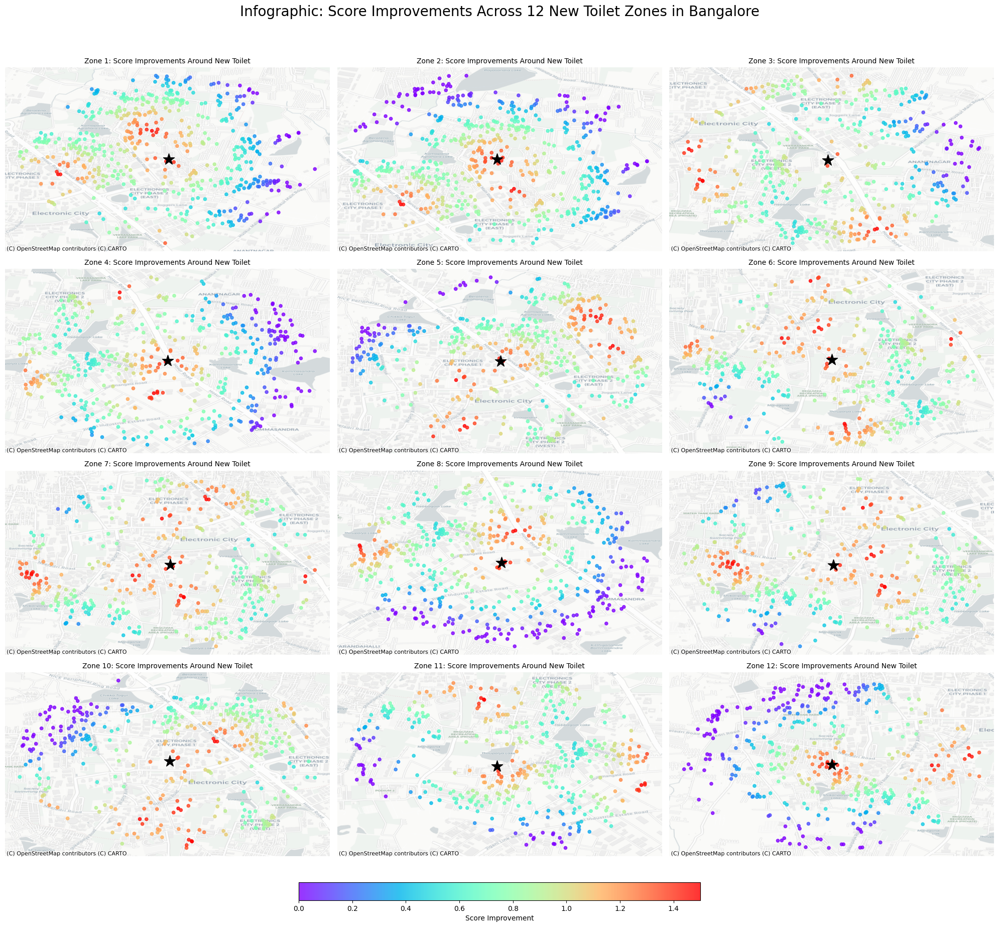

In [34]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from geopy.distance import geodesic

# Create 4x3 grid
fig, axs = plt.subplots(4, 3, figsize=(20, 18))
axs = axs.flatten()

# Collect score changes for unified color scaling
all_score_changes = []
for point in new_toilet_points_diverse.geometry:
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()
    if not nearby.empty:
        nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']
        all_score_changes.extend(nearby['Score_Change'].values)

vmin, vmax = min(all_score_changes), max(all_score_changes)

# Plot each zone
for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry, axs)):
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        ax.set_title(f"Zone {idx+1}: No Data")
        ax.axis('off')
        continue

    # Score change calculation
    nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']

    # Reproject for map overlay
    nearby_web = nearby.to_crs(epsg=3857)
    point_web = gpd.GeoSeries([point], crs="EPSG:4326").to_crs(epsg=3857)

    # Scatter plot with consistent color scale
    sc = ax.scatter(
        nearby_web.geometry.x,
        nearby_web.geometry.y,
        c=nearby_web['Score_Change'],
        cmap='rainbow',
        s=20,
        alpha=0.8,
        vmin=vmin,
        vmax=vmax
    )

    ax.scatter(point_web.geometry.x, point_web.geometry.y, color='black', marker='*', s=280, label='New Toilet')

    # Add basemap layer
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=nearby_web.crs, zoom=15)

    # Subplot polish
    ax.set_title(f"Zone {idx+1}: Score Improvements Around New Toilet", fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_axis_off()

# Final layout & horizontal colorbar
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
cbar_ax = fig.add_axes([0.3, 0.01, 0.4, 0.02])
fig.colorbar(sc, cax=cbar_ax, orientation='horizontal', label='Score Improvement')

# Add title and export
plt.suptitle("Infographic: Score Improvements Across 12 New Toilet Zones in Bangalore", fontsize=20, y=1.00)
fig.savefig("BangaloreToiletZone_Infographic_withBasemap.png", dpi=300, bbox_inches='tight')
plt.show()


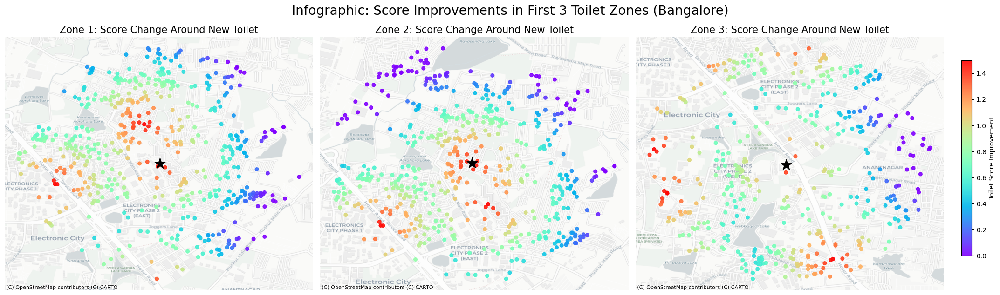

In [35]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from geopy.distance import geodesic

# Step 1: Prepare subplot layout
fig, axs = plt.subplots(1, 3, figsize=(22, 6))
axs = axs.flatten()

# Step 2: Collect all Score_Change values for color scale normalization
all_score_changes = []
for point in new_toilet_points_diverse.geometry[:3]:
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ]
    if not nearby.empty:
        deltas = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']
        all_score_changes.extend(deltas.values)

vmin, vmax = min(all_score_changes), max(all_score_changes)

# Step 3: Plot each zone with basemap and consistent color scaling
for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry[:3], axs)):
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        ax.set_title(f"Zone {idx+1}: No Data", fontsize=12)
        ax.axis('off')
        continue

    nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']

    # Reproject to EPSG:3857
    nearby_web = nearby.to_crs(epsg=3857)
    point_web = gpd.GeoSeries([point], crs="EPSG:4326").to_crs(epsg=3857)

    # Plot resident score changes
    sc = ax.scatter(
        nearby_web.geometry.x, nearby_web.geometry.y,
        c=nearby_web['Score_Change'], cmap='rainbow', s=30, alpha=0.9,
        vmin=vmin, vmax=vmax
    )

    # Mark new toilet location
    ax.scatter(point_web.geometry.x, point_web.geometry.y, color='black', marker='*', s=300, label='New Toilet')

    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=nearby_web.crs, zoom=15)

    # Subplot polish
    ax.set_title(f"Zone {idx+1}: Score Change Around New Toilet", fontsize=15)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_axis_off()

# Step 4: Layout and shared vertical colorbar
fig.tight_layout(rect=[0, 0, 0.93, 1])
cbar_ax = fig.add_axes([0.94, 0.15, 0.01, 0.7])
fig.colorbar(sc, cax=cbar_ax, label='Toilet Score Improvement')

# Title
plt.suptitle("Infographic: Score Improvements in First 3 Toilet Zones (Bangalore)", fontsize=20, y=1.05)

# Optional save
plt.savefig("3BngaloreToiletZones_First3_withBasemap.png", dpi=300, bbox_inches='tight')
plt.show()


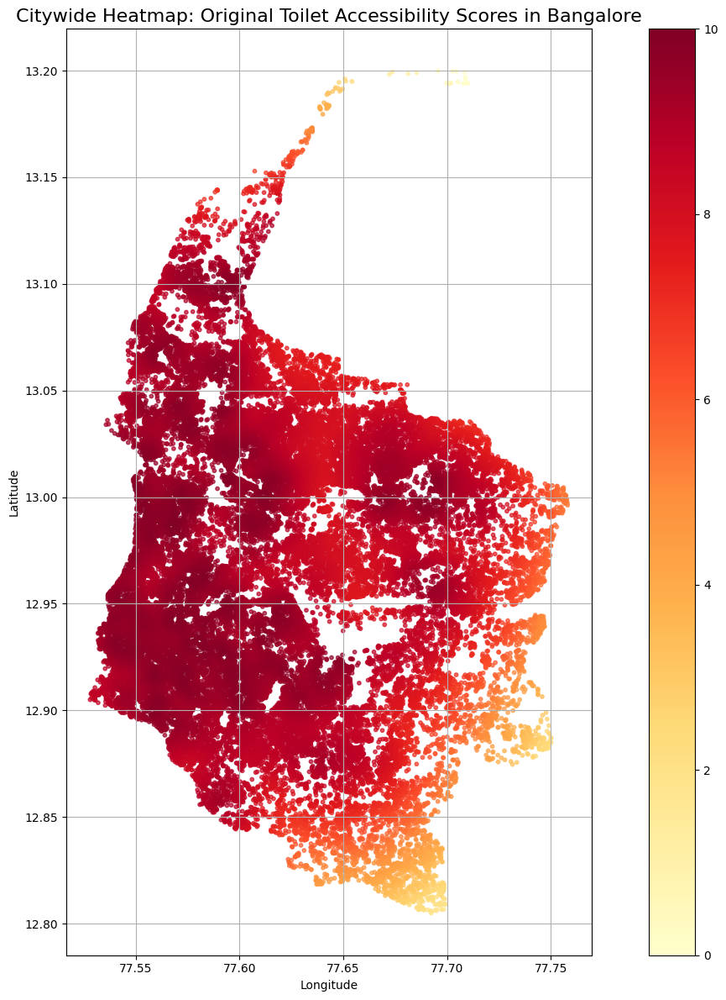

In [36]:
# Plot a citywide heatmap of original Toilet Accessibility Scores

fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(
    ax=ax,
    column='Toilet_Score',
    cmap='YlOrRd',
    markersize=10,
    alpha=0.7,
    legend=True
)

plt.title("Citywide Heatmap: Original Toilet Accessibility Scores in Bangalore", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


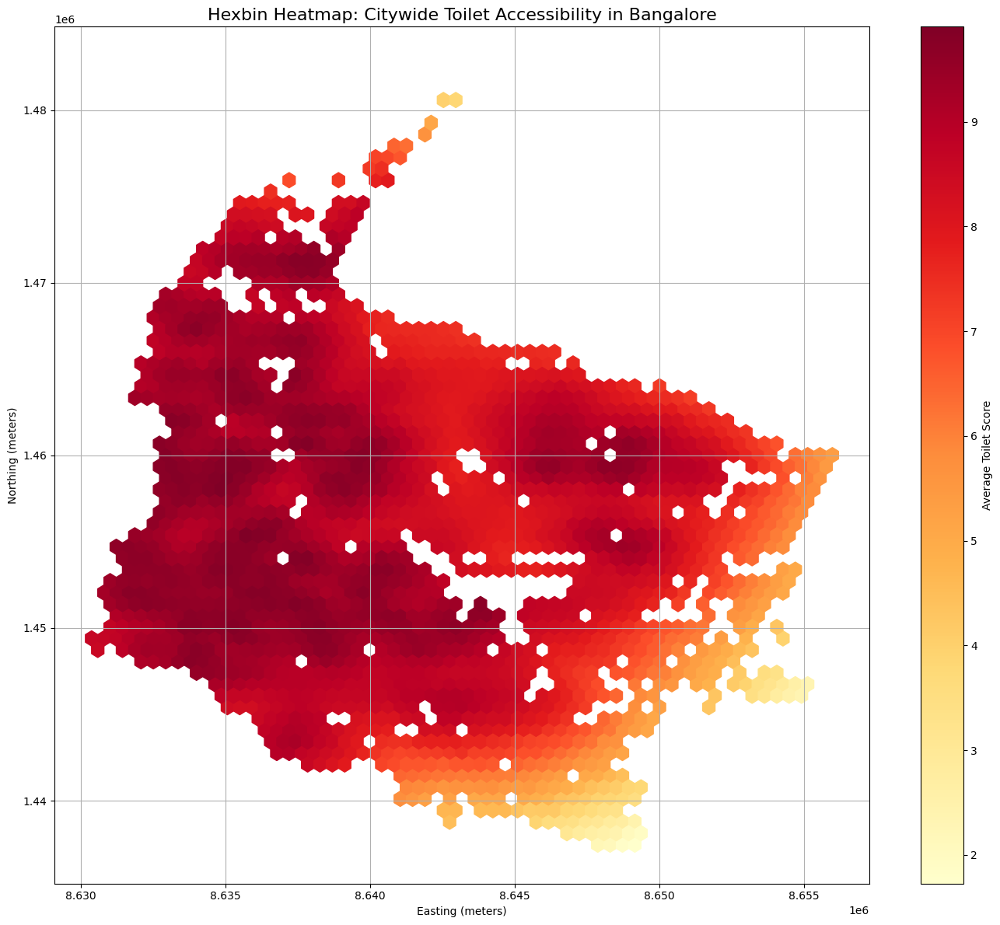

In [37]:
import numpy as np

# Convert to metric projection for hexbin visualization
residents_proj = residents_gdf.to_crs(epsg=3857)

# Extract x/y and Toilet Scores
x = residents_proj.geometry.x
y = residents_proj.geometry.y
scores = residents_proj['Toilet_Score']

# Create hexbin heatmap
fig, ax = plt.subplots(figsize=(14, 12))
hb = ax.hexbin(x, y, C=scores, gridsize=60, cmap='YlOrRd', reduce_C_function=np.mean, mincnt=5)
cb = fig.colorbar(hb, ax=ax)
cb.set_label('Average Toilet Score')

ax.set_title("Hexbin Heatmap: Citywide Toilet Accessibility in Bangalore", fontsize=16)
ax.set_xlabel("Easting (meters)")
ax.set_ylabel("Northing (meters)")
plt.grid(True)
plt.tight_layout()
plt.show()


In [38]:
# Modified version: adds coordinate text below each toilet marker
'''
fig, axs = plt.subplots(4, 3, figsize=(20, 18))
axs = axs.flatten()

for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry, axs)):
    # Filter residents near this toilet (within 1.5km)
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        continue

    # Compute score change
    nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']

    # Plot score changes
    sc = ax.scatter(
        nearby.geometry.x, nearby.geometry.y,
        c=nearby['Score_Change'], cmap='YlOrRd', s=20, alpha=0.8
    )

    # Plot new toilet location
    ax.scatter(point.x, point.y, color='red', marker='*', s=180, label='New Toilet')

    # Annotate coordinates below marker
    coord_label = f"({round(point.y, 4)}, {round(point.x, 4)})"
    ax.text(point.x, point.y - 0.001, coord_label, fontsize=8, ha='center', va='top', color='black')

    ax.set_title(f"Zone {idx+1}: Score Improvements Around New Toilet", fontsize=12)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.grid(True)

# Layout and colorbar
fig.tight_layout()
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(sc, cax=cbar_ax, label='Score Improvement')
plt.suptitle("Infographic: Score Improvements Across 12 New Toilet Zones", fontsize=20, y=1.02)
plt.show()
'''

'\nfig, axs = plt.subplots(4, 3, figsize=(20, 18))\naxs = axs.flatten()\n\nfor idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry, axs)):\n    # Filter residents near this toilet (within 1.5km)\n    nearby = residents_gdf[\n        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)\n    ].copy()\n\n    if nearby.empty:\n        continue\n\n    # Compute score change\n    nearby[\'Score_Change\'] = nearby[\'Toilet_Score_Improved_Diverse\'] - nearby[\'Toilet_Score\']\n\n    # Plot score changes\n    sc = ax.scatter(\n        nearby.geometry.x, nearby.geometry.y,\n        c=nearby[\'Score_Change\'], cmap=\'YlOrRd\', s=20, alpha=0.8\n    )\n\n    # Plot new toilet location\n    ax.scatter(point.x, point.y, color=\'red\', marker=\'*\', s=180, label=\'New Toilet\')\n\n    # Annotate coordinates below marker\n    coord_label = f"({round(point.y, 4)}, {round(point.x, 4)})"\n    ax.text(point.x, point.y - 0.001, coord_label, fontsize=8, h

'plt.title("Scenario Map: Preferred Residential Buildings (Close to Metro Stations)")\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

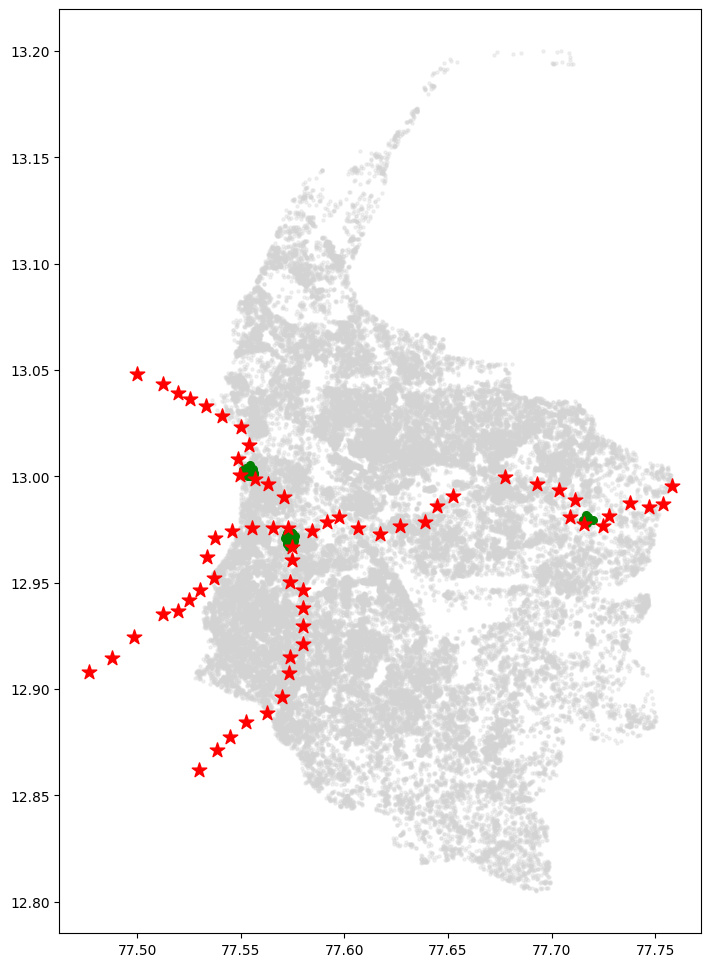

In [39]:
# Let's simulate a scenario where a resident prefers to live near Metro stations
# We'll select top 100 buildings with highest Metro_Score

# Sort by Metro_Score and select top buildings
preferred_residents = residents_gdf.sort_values("Metro_Score", ascending=False).head(100)

# Plot the preferred buildings with metro stations
fig, ax = plt.subplots(figsize=(14, 12))

# Base layer of all buildings (light)
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3, label='Other Buildings')

# Highlight preferred buildings (near metro)
preferred_residents.plot(ax=ax, color='green', markersize=30, label='Preferred Buildings')

# Load Metro stations from earlier uploaded KML
def parse_kml_to_gdf(kml_path, name):
    import xml.etree.ElementTree as ET
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}
    tree = ET.parse(kml_path)
    root = tree.getroot()
    names, coords = [], []
    for placemark in root.findall('.//kml:Placemark', namespace):
        coord = placemark.find('.//kml:coordinates', namespace)
        if coord is not None:
            lon, lat, *_ = map(float, coord.text.strip().split(','))
            coords.append(Point(lon, lat))
    return gpd.GeoDataFrame({'name': [name]*len(coords), 'geometry': coords}, crs="EPSG:4326")

metro_stations_gdf = parse_kml_to_gdf("bengaluru-metro-stations.kml", "Metro Station")
metro_stations_gdf.plot(ax=ax, color='red', marker='*', markersize=120, label='Metro Stations')

'''plt.title("Scenario Map: Preferred Residential Buildings (Close to Metro Stations)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

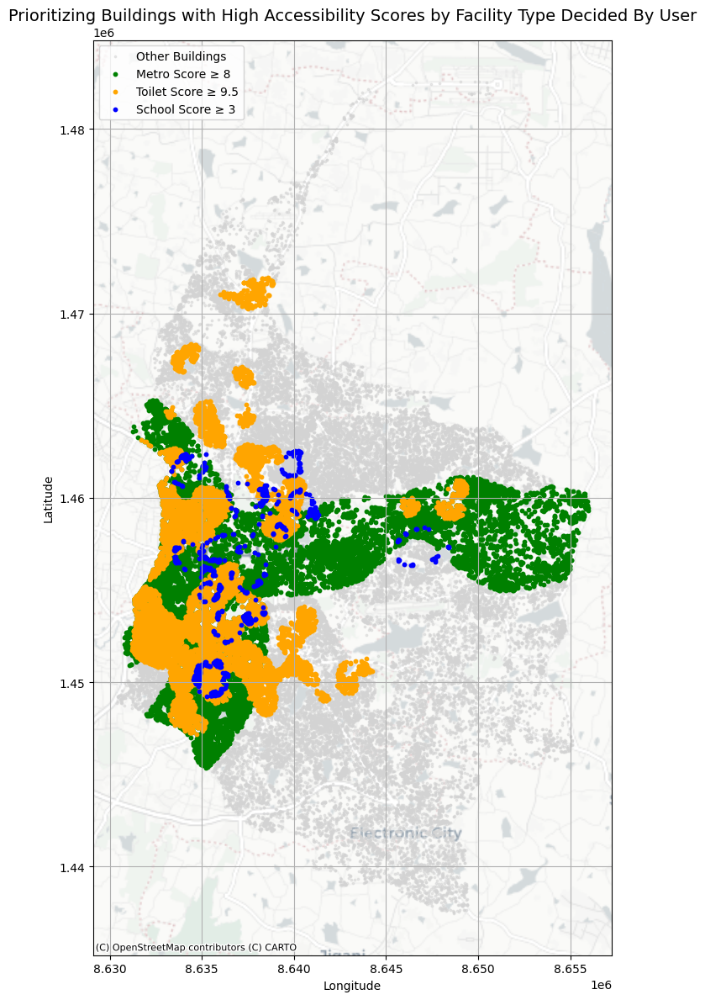

In [40]:
import contextily as ctx

# Filter buildings with high facility scores
metro_high = residents_gdf[residents_gdf["Metro_Score"] >= 8]
school_high = residents_gdf[residents_gdf["School_Score"] >= 3]
toilet_high = residents_gdf[residents_gdf["Toilet_Score"] >= 9.5]

# Convert all to Web Mercator for basemap compatibility
residents_web = residents_gdf.to_crs(epsg=3857)
metro_high_web = metro_high.to_crs(epsg=3857)
school_high_web = school_high.to_crs(epsg=3857)
toilet_high_web = toilet_high.to_crs(epsg=3857)

# Plot with basemap and highlighted points
fig, ax = plt.subplots(figsize=(14, 12))
residents_web.plot(ax=ax, color='lightgray', markersize=3, alpha=0.5, label='Other Buildings')
metro_high_web.plot(ax=ax, color='green', markersize=10, label='Metro Score ≥ 8')
toilet_high_web.plot(ax=ax, color='orange', markersize=10, label='Toilet Score ≥ 9.5')
school_high_web.plot(ax=ax, color='blue', markersize=10, label='School Score ≥ 3')

# Add basemap - clean and elegant
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Format the map
plt.title("Prioritizing Buildings with High Accessibility Scores by Facility Type Decided By User", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('UserCase.png', dpi = 300)
plt.show()


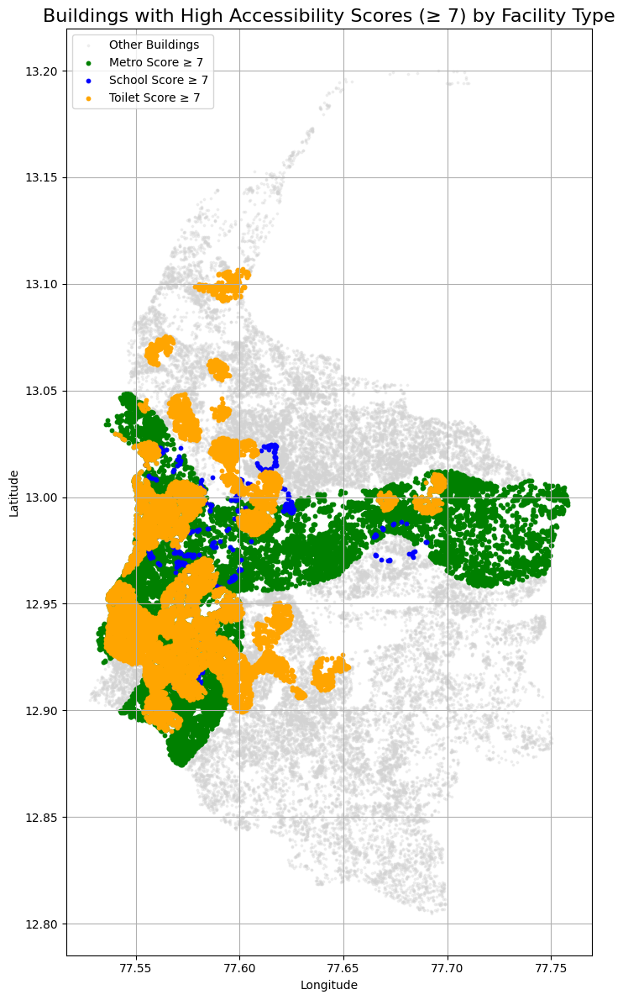

In [41]:
# Filter buildings with Metro_Score >= 7
metro_high = residents_gdf[residents_gdf["Metro_Score"] >= 8]
school_high = residents_gdf[residents_gdf["School_Score"] >= 3]
toilet_high = residents_gdf[residents_gdf["Toilet_Score"] >= 9.5]

# Plot the map highlighting each facility preference
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

metro_high.plot(ax=ax, color='green', markersize=10, label='Metro Score ≥ 7')
school_high.plot(ax=ax, color='blue', markersize=10, label='School Score ≥ 7')
toilet_high.plot(ax=ax, color='orange', markersize=10, label='Toilet Score ≥ 7')

plt.title("Buildings with High Accessibility Scores (≥ 7) by Facility Type", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [42]:
# Define facility score columns and color settings
facilities = {
    "Metro": {
        "score_col": "Metro_Score",
        "color": "green",
        "marker_color": "red",
        "marker_file": "bengaluru-metro-stations.kml"
    },
    "School": {
        "score_col": "School_Score",
        "color": "blue",
        "marker_color": "black",
        "marker_file": "bbmp-schools-2013.kml"
    },
    "Toilet": {
        "score_col": "Toilet_Score",
        "color": "orange",
        "marker_color": "purple",
        "marker_file": "bbmp-toilets.kml"
    }
}

# Helper function to parse KML into GeoDataFrame
def parse_kml_to_gdf(kml_path, label):
    import xml.etree.ElementTree as ET
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}
    tree = ET.parse(kml_path)
    root = tree.getroot()
    coords = []
    for placemark in root.findall('.//kml:Placemark', namespace):
        coord = placemark.find('.//kml:coordinates', namespace)
        if coord is not None:
            lon, lat, *_ = map(float, coord.text.strip().split(','))
            coords.append(Point(lon, lat))
    return gpd.GeoDataFrame({'type': [label] * len(coords), 'geometry': coords}, crs="EPSG:4326")

# Generate individual maps
'''for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 8]
    markers = parse_kml_to_gdf(data["marker_file"], name)

    fig, ax = plt.subplots(figsize=(14, 12))
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 8')
    markers.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    plt.title(f"Buildings with {name} Score ≥ 5 and Facility Locations", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()'''


'for name, data in facilities.items():\n    score_col = data["score_col"]\n    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 8]\n    markers = parse_kml_to_gdf(data["marker_file"], name)\n\n    fig, ax = plt.subplots(figsize=(14, 12))\n    residents_gdf.plot(ax=ax, color=\'lightgray\', markersize=3, alpha=0.3, label=\'Other Buildings\')\n    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f\'{name} Score ≥ 8\')\n    markers.plot(ax=ax, color=data["marker_color"], marker=\'*\', markersize=120, label=f\'{name} Locations\')\n\n    plt.title(f"Buildings with {name} Score ≥ 5 and Facility Locations", fontsize=16)\n    plt.xlabel("Longitude")\n    plt.ylabel("Latitude")\n    plt.legend()\n    plt.grid(True)\n    plt.tight_layout()\n    plt.show()'

In [43]:
# Load raw geometry from BBMP.geojson and extract valid polygons manually
from shapely.geometry import shape

with open("BBMP.geojson", "r") as f:
    bbmp_data = json.load(f)

# Extract all valid polygon/multipolygon shapes
bbmp_shapes = [shape(feature["geometry"]) for feature in bbmp_data["features"]]

# Build a boundary GeoSeries for plotting
bangalore_boundary = gpd.GeoSeries(bbmp_shapes, crs="EPSG:4326")

# Clip-like behavior: filter facility points manually using within()
clipped_facilities = {}
for name, data in facilities.items():
    markers = parse_kml_to_gdf(data["marker_file"], name)
    markers_inside = markers[markers.geometry.apply(lambda g: any(g.within(p) for p in bbmp_shapes))]
    clipped_facilities[name] = markers_inside

# Replot facilities and buildings with score ≥ 5, manually over BBMP boundary
'''for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')
    markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')
    bangalore_boundary.boundary.plot(ax=ax, color='black', linewidth=1)

    plt.title(f"{name} Facilities & High-Score Buildings (≥5) — Inside BBMP Area", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
'''

NameError: name 'json' is not defined

In [ ]:
#pip install descartes

In [ ]:
# Load raw polygons from BBMP.geojson
with open("BBMP.geojson", "r") as f:
    bbmp_data = json.load(f)

# Extract valid polygons and multipolygons
bbmp_polygons = [shape(feature["geometry"]) for feature in bbmp_data["features"] if shape(feature["geometry"]).geom_type in ["Polygon", "MultiPolygon"]]

# Filter markers manually: only keep those within any of the BBMP polygons
clipped_facilities = {}
for name, data in facilities.items():
    markers = parse_kml_to_gdf(data["marker_file"], name)
    # Keep only markers that fall within any polygon
    markers_inside = markers[markers.geometry.apply(lambda pt: any(pt.within(poly) for poly in bbmp_polygons))]
    clipped_facilities[name] = markers_inside

# Plot each map manually using matplotlib polygon outlines
from descartes import PolygonPatch

'''for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))

    # Base layer: all buildings
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

    # Buildings with high score
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')

    # Facility markers
    markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    # Plot boundary polygons
    for poly in bbmp_polygons:
        if poly.geom_type == "Polygon":
            patch = PolygonPatch(poly, fill=False, edgecolor='black', linewidth=1)
            ax.add_patch(patch)
        elif poly.geom_type == "MultiPolygon":
            for subpoly in poly.geoms:
                patch = PolygonPatch(subpoly, fill=False, edgecolor='black', linewidth=1)
                ax.add_patch(patch)

    plt.title(f"{name} Facilities & Buildings (≥5 Score) — Within BBMP Area", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()'''


In [ ]:
# Use basic matplotlib plotting (no descartes) to draw boundary outlines
'''for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))

    # Base layer
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')
    markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    # Plot boundary outline using basic matplotlib
    for poly in bbmp_polygons:
        if poly.geom_type == "Polygon":
            x, y = poly.exterior.xy
            ax.plot(x, y, color='black', linewidth=1)
        elif poly.geom_type == "MultiPolygon":
            for subpoly in poly.geoms:
                x, y = subpoly.exterior.xy
                ax.plot(x, y, color='black', linewidth=1)

    plt.title(f"{name} Facilities & Buildings (≥5 Score) — Within BBMP Area", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
'''

In [ ]:
# Re-run for all facilities: Metro, School, Toilet
'''for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 5]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))

    # Plot all buildings (light gray)
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

    # Plot high-score buildings
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 5')

    # Plot filtered facility markers
    markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

    # Draw BBMP boundary
    for poly in bbmp_polygons:
        if poly.geom_type == "Polygon":
            x, y = poly.exterior.xy
            ax.plot(x, y, color='black', linewidth=1)
        elif poly.geom_type == "MultiPolygon":
            for subpoly in poly.geoms:
                x, y = subpoly.exterior.xy
                ax.plot(x, y, color='black', linewidth=1)

    plt.title(f"{name} Facilities & Buildings (≥5 Score) — Inside BBMP Boundary", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()'''


In [ ]:
# Rewrite using already parsed and clipped facility markers (clipped_facilities)

# Update visualization loop with clipped data
for name, data in facilities.items():
    score_col = data["score_col"]
    high_score_buildings = residents_gdf[residents_gdf[score_col] >= 8]
    markers_inside = clipped_facilities[name]

    fig, ax = plt.subplots(figsize=(14, 12))
    residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')
    high_score_buildings.plot(ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 8')
    markers_inside.plot(ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations')

   ''' plt.title(f"{name} Score ≥ 8 Buildings & Facility Locations (Clipped to BBMP)", fontsize=16)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()'''


In [49]:
#pip install contextily

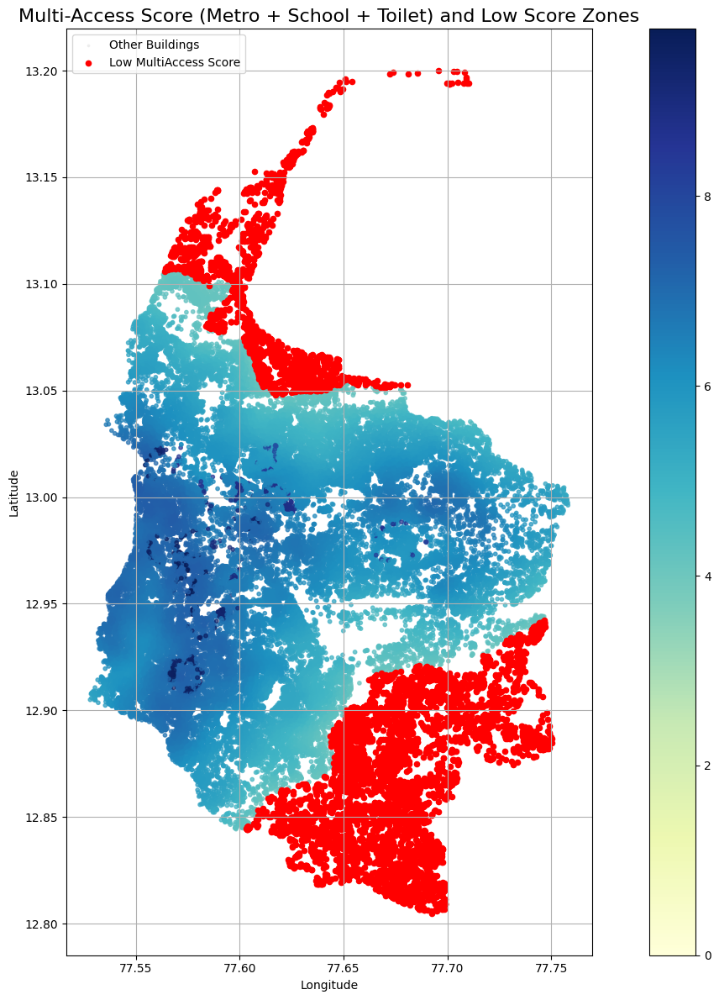

In [50]:
# Step 1: Compute combined accessibility score (average of 3 facilities)
residents_gdf['MultiAccess_Score'] = (
    residents_gdf['Metro_Score'] +
    residents_gdf['School_Score'] +
    residents_gdf['Toilet_Score']
) / 3

# Step 2: Identify low-score regions (bottom 10%)
low_score_threshold = residents_gdf['MultiAccess_Score'].quantile(0.15)
low_access_residents = residents_gdf[residents_gdf['MultiAccess_Score'] <= low_score_threshold].copy()

# Step 3: Visualize multi-accessibility + low score areas
fig, ax = plt.subplots(figsize=(14, 12))

# All buildings for context
residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

# Highlight multi-access score with color gradient
residents_gdf.plot(ax=ax, column='MultiAccess_Score', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)

# Highlight low-score buildings
low_access_residents.plot(ax=ax, color='red', markersize=20, label='Low MultiAccess Score')


plt.title("Multi-Access Score (Metro + School + Toilet) and Low Score Zones", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [51]:
low_threshold = residents_gdf['MultiAccess_Score'].quantile(0.1)
low_access_buildings = residents_gdf[residents_gdf['MultiAccess_Score'] <= low_threshold]

In [52]:
# Re-import necessary modules after session reset
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Reload the residents dataset
'''residents_df = pd.read_csv("BangaloreScoreV1.csv")
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)

# Recompute MultiAccess Score (Metro + School + Toilet)
residents_gdf['MultiAccess_Score'] = (
    residents_gdf['Metro_Score'] +
    residents_gdf['School_Score'] +
    residents_gdf['Toilet_Score']
) / 3

# Identify bottom 10% MultiAccess buildings
low_threshold = residents_gdf['MultiAccess_Score'].quantile(0.1)
low_access_buildings = residents_gdf[residents_gdf['MultiAccess_Score'] <= low_threshold]

# Plot MultiAccess Score map with low-score areas highlighted
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='MultiAccess_Score', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
low_access_buildings.plot(ax=ax, color='red', markersize=30, label='Low MultiAccess Score (Bottom 10%)')

plt.title("Citywide Multi-Access Score & Low Score Zones (Metro + School + Toilet)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()'''


'residents_df = pd.read_csv("BangaloreScoreV1.csv")\nresidents_gdf = gpd.GeoDataFrame(\n    residents_df,\n    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),\n    crs="EPSG:4326"\n)\n\n# Recompute MultiAccess Score (Metro + School + Toilet)\nresidents_gdf[\'MultiAccess_Score\'] = (\n    residents_gdf[\'Metro_Score\'] +\n    residents_gdf[\'School_Score\'] +\n    residents_gdf[\'Toilet_Score\']\n) / 3\n\n# Identify bottom 10% MultiAccess buildings\nlow_threshold = residents_gdf[\'MultiAccess_Score\'].quantile(0.1)\nlow_access_buildings = residents_gdf[residents_gdf[\'MultiAccess_Score\'] <= low_threshold]\n\n# Plot MultiAccess Score map with low-score areas highlighted\nfig, ax = plt.subplots(figsize=(14, 12))\nresidents_gdf.plot(ax=ax, column=\'MultiAccess_Score\', cmap=\'YlGnBu\', markersize=10, alpha=0.7, legend=True)\nlow_access_buildings.plot(ax=ax, color=\'red\', markersize=30, label=\'Low MultiAccess Score (Bottom 10%)\')\n\nplt.title("Citywide Multi-

In [53]:
import numpy as np
from geopy.distance import geodesic

# Step 1: Get coordinates of low-score buildings
low_coords = np.array([(g.y, g.x) for g in low_access_buildings.geometry])

# Step 2: Choose ~10 new installations by selecting top dense low-score areas
from sklearn.neighbors import KernelDensity

# Estimate density in low-score regions
xy = np.vstack([low_coords[:, 1], low_coords[:, 0]]).T
kde = KernelDensity(bandwidth=0.01, metric='euclidean')
kde.fit(xy)
densities = kde.score_samples(xy)

# Select top 10 most dense low-score building locations
low_access_buildings['density'] = densities
top10_points = low_access_buildings.sort_values("density", ascending=False).drop_duplicates("geometry").head(10)
new_facility_points = gpd.GeoDataFrame(geometry=top10_points.geometry, crs="EPSG:4326")
new_facility_coords = np.array([(g.y, g.x) for g in new_facility_points.geometry])

# Step 3: Simulate score improvement for each building based on proximity to new facilities
def compute_min_distances(from_coords, to_coords):
    return np.min([[geodesic(f, t).km for t in to_coords] for f in from_coords], axis=1)

res_coords = np.array([(g.y, g.x) for g in residents_gdf.geometry])
min_distances = compute_min_distances(res_coords, new_facility_coords)

# Step 4: Apply score boost if building is within 1.2km
simulated_boost = np.clip((1 - min_distances / 1.2) * 1.5, 0, None)
residents_gdf['Simulated_MultiAccess'] = np.clip(residents_gdf['MultiAccess_Score'] + simulated_boost, 0, 10)

# Step 5: Plot new MultiAccess with improvements
'''fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='Simulated_MultiAccess', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
new_facility_points.plot(ax=ax, color='red', marker='*', markersize=200, label='New Simulated Facility')

plt.title("Simulated Multi-Access Score After New Facility Installations", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


'fig, ax = plt.subplots(figsize=(14, 12))\nresidents_gdf.plot(ax=ax, column=\'Simulated_MultiAccess\', cmap=\'YlGnBu\', markersize=10, alpha=0.7, legend=True)\nnew_facility_points.plot(ax=ax, color=\'red\', marker=\'*\', markersize=200, label=\'New Simulated Facility\')\n\nplt.title("Simulated Multi-Access Score After New Facility Installations", fontsize=16)\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

In [54]:
# Step 1: Automatically identify optimal installation zones
# Already selected top 10 dense clusters among low-access areas: `top10_points`
# Let's visualize them again clearly

'''fig, ax = plt.subplots(figsize=(14, 12))

# Base layer: before simulated boost
residents_gdf.plot(ax=ax, column='MultiAccess_Score', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)

# Highlight low-score buildings
low_access_buildings.plot(ax=ax, color='red', markersize=25, label='Low MultiAccess Score (Bottom 10%)')

# Mark proposed new facility locations
top10_points.plot(ax=ax, color='black', marker='*', markersize=100, label='Proposed New Facility')

plt.title("Optimal Facility Locations to Uplift MultiAccess Scores", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
'''

'fig, ax = plt.subplots(figsize=(14, 12))\n\n# Base layer: before simulated boost\nresidents_gdf.plot(ax=ax, column=\'MultiAccess_Score\', cmap=\'YlGnBu\', markersize=10, alpha=0.7, legend=True)\n\n# Highlight low-score buildings\nlow_access_buildings.plot(ax=ax, color=\'red\', markersize=25, label=\'Low MultiAccess Score (Bottom 10%)\')\n\n# Mark proposed new facility locations\ntop10_points.plot(ax=ax, color=\'black\', marker=\'*\', markersize=100, label=\'Proposed New Facility\')\n\nplt.title("Optimal Facility Locations to Uplift MultiAccess Scores", fontsize=16)\nplt.xlabel("Longitude")\nplt.ylabel("Latitude")\nplt.legend()\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n'

C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\Apoorva\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_in

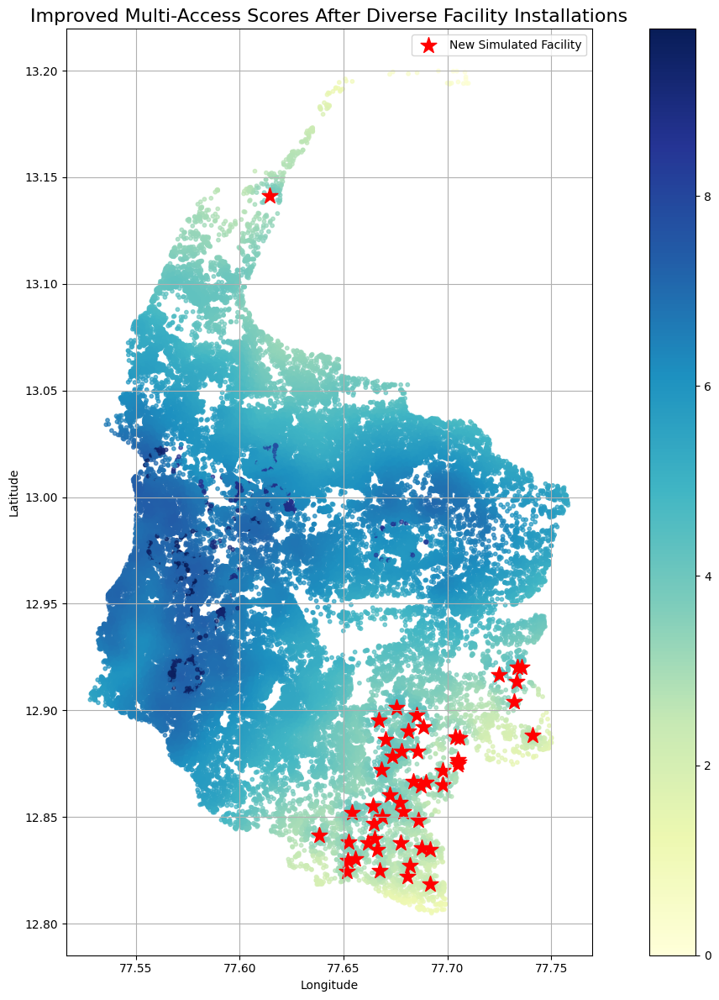

In [55]:
# Fix: ensure spatial diversity by binning and deduplicating low-score buildings by lat/lon grid
residents_gdf['MultiAccess_Score'] = (
    residents_gdf['Metro_Score'] +
    residents_gdf['School_Score'] +
    residents_gdf['Toilet_Score']
) / 3

# Recompute KDE-based density on low-score areas
low_access_buildings['lat_bin'] = low_access_buildings.geometry.y.round(2)
low_access_buildings['lon_bin'] = low_access_buildings.geometry.x.round(2)

# Drop duplicates per bin to force spatial diversity
diverse_candidates = low_access_buildings.drop_duplicates(subset=['lat_bin', 'lon_bin'])

# Sort by KDE density and select top diverse candidates
xy = np.vstack([diverse_candidates.geometry.x, diverse_candidates.geometry.y]).T
kde = KernelDensity(bandwidth=0.01, metric='euclidean')
kde.fit(xy)
diverse_candidates['density'] = kde.score_samples(xy)
top10_points_diverse = diverse_candidates.sort_values("density", ascending=False).head(50)

# New facilities
new_facility_points = gpd.GeoDataFrame(geometry=top10_points_diverse.geometry, crs="EPSG:4326")
new_facility_coords = np.array([(pt.y, pt.x) for pt in new_facility_points.geometry])

# Simulate score improvements again with new facility distribution
def compute_min_distances(from_coords, to_coords):
    return np.min([[geodesic(f, t).km for t in to_coords] for f in from_coords], axis=1)

res_coords = np.array([(g.y, g.x) for g in residents_gdf.geometry])
min_distances = compute_min_distances(res_coords, new_facility_coords)

simulated_boost = np.clip((1 - min_distances / 1.2) * 1.5, 0, None)
residents_gdf['Simulated_MultiAccess'] = np.clip(residents_gdf['MultiAccess_Score'] + simulated_boost, 0, 50)

# Plot corrected simulation with spatially diverse facility markers
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='Simulated_MultiAccess', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
new_facility_points.plot(ax=ax, color='red', marker='*', markersize=200, label='New Simulated Facility')
plt.savefig('BangaloreInstallation.png', dpi = 300)
plt.title("Improved Multi-Access Scores After Diverse Facility Installations", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\Apoorva\AppData\Local\Temp\ipykernel_16252\1683159894.py:23: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  subset.plot(


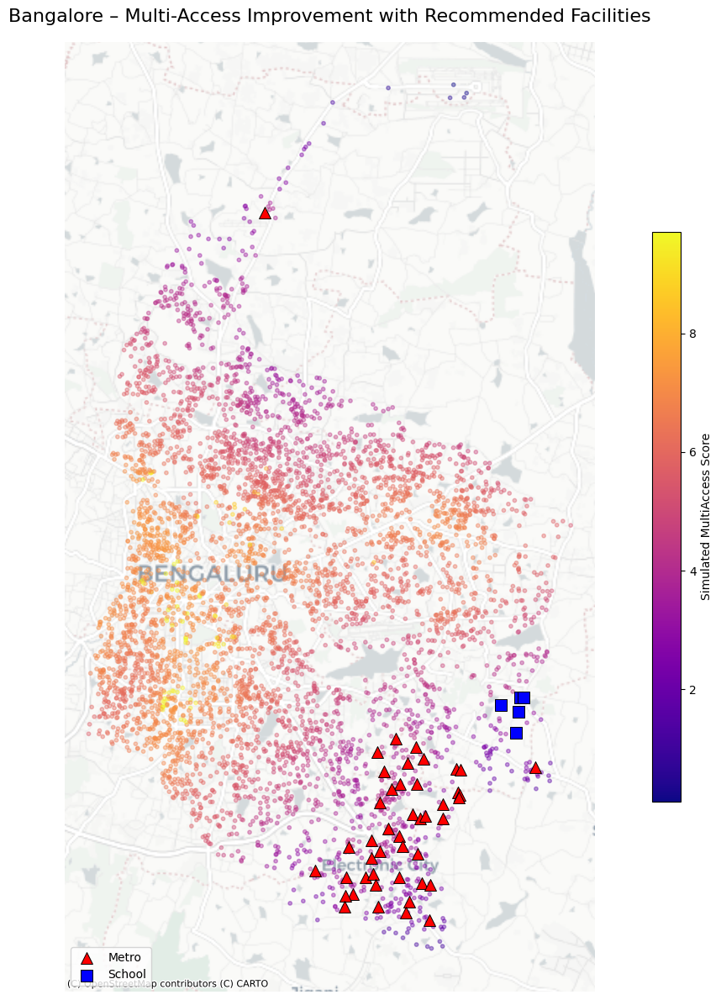

In [59]:
import contextily as ctx

# Reproject to Web Mercator (EPSG:3857) for basemap compatibility
sampled_gdf_web = sampled_gdf.to_crs(epsg=3857)
facility_points_web = new_facility_points.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(14, 12))

# Plot sampled residential points colored by Simulated MultiAccess Score
sampled_gdf_web.plot(
    ax=ax,
    column='Simulated_MultiAccess',
    cmap='plasma',
    markersize=10,
    alpha=0.4,
    legend=True,
    legend_kwds={'label': "Simulated MultiAccess Score", 'shrink': 0.6}
)

# Plot recommended facilities with styled markers + black border
for category, style in marker_styles.items():
    subset = facility_points_web[facility_points_web['Recommended'] == category]
    subset.plot(
        ax=ax,
        color=style['color'],
        marker=style['marker'],
        markersize=100,
        edgecolor='black',     # Black border around each marker
        linewidth=0.7,
        label=category
    )

# Add basemap layer
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=sampled_gdf_web.crs)

# Final polish
ax.set_title("Bangalore – Multi-Access Improvement with Recommended Facilities", fontsize=16)
ax.set_axis_off()
ax.legend(loc='lower left', fontsize='medium')
plt.tight_layout()
plt.savefig("BangaloreFacility_withBasemap.png", dpi=300)
plt.show()


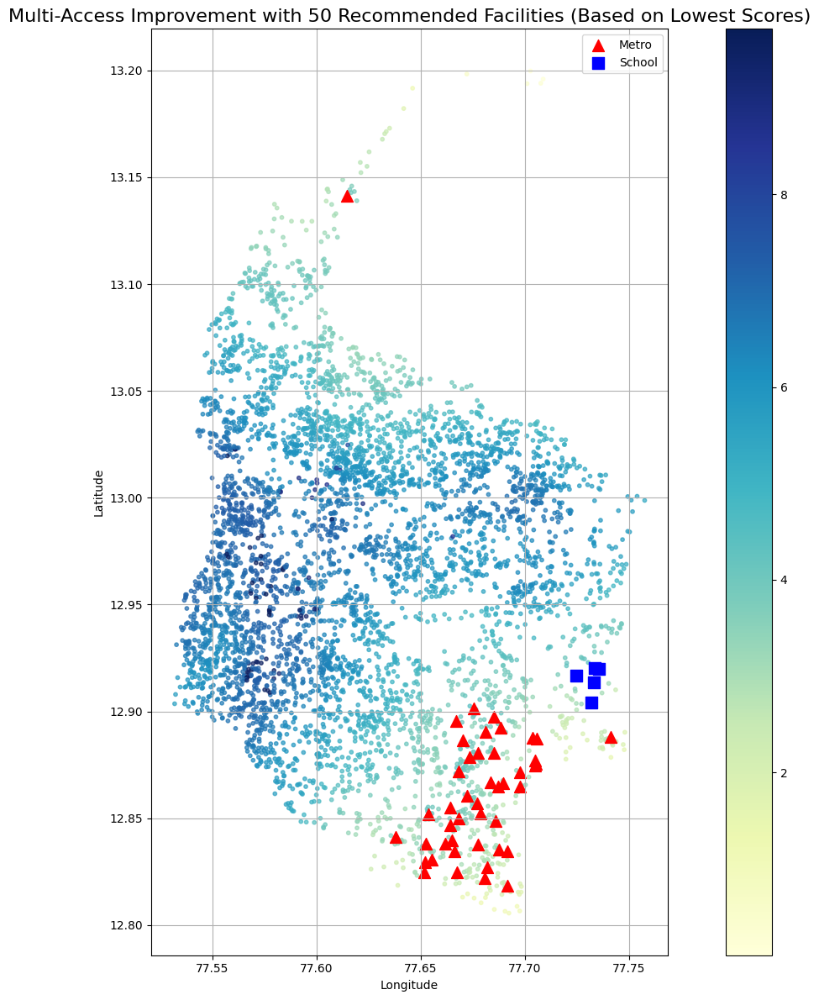

In [57]:
# Re-import necessary modules
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point
from geopy.distance import geodesic
from sklearn.neighbors import KernelDensity

# Load residents data
residents_df = pd.read_csv("BangaloreScoreV1.csv")
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)

# Step 1: Compute MultiAccess Score as average of three key facility scores
residents_gdf['MultiAccess_Score'] = (
    residents_gdf['Metro_Score'] +
    residents_gdf['School_Score'] +
    residents_gdf['Toilet_Score']
) / 3

# Step 2: Identify buildings in the bottom 10% of MultiAccess scores
low_threshold = residents_gdf['MultiAccess_Score'].quantile(0.1)
low_access_clean = residents_gdf[residents_gdf['MultiAccess_Score'] <= low_threshold].copy()

# Step 3: Remove spatially redundant points by rounding lat/lon and deduplicating
lat_bin = low_access_clean.geometry.y.round(2)
lon_bin = low_access_clean.geometry.x.round(2)
low_access_clean = low_access_clean.assign(lat_bin=lat_bin, lon_bin=lon_bin)
diverse_candidates = low_access_clean.drop_duplicates(subset=['lat_bin', 'lon_bin']).copy()

# Step 4: Use KDE to score diversity and density of low-access areas
xy = np.vstack([diverse_candidates.geometry.x.values, diverse_candidates.geometry.y.values]).T
kde = KernelDensity(bandwidth=0.01, metric='euclidean')
kde.fit(xy)
density_scores = kde.score_samples(xy)
diverse_candidates['density'] = density_scores

# Step 5: Select top 50 dense and spatially diverse underserved locations
top_points_diverse = diverse_candidates.sort_values("density", ascending=False).head(50)

# Step 6: Assign recommended facility based on lowest score
def get_lowest_scoring_facility(row):
    scores = {
        'Metro': row['Metro_Score'],
        'Toilet': row['Toilet_Score'],
        'School': row['School_Score']
    }
    return min(scores, key=scores.get)

top_points_diverse['Recommended'] = top_points_diverse.apply(get_lowest_scoring_facility, axis=1)
new_facility_points = gpd.GeoDataFrame(top_points_diverse, crs="EPSG:4326")
new_facility_coords = np.array([(pt.y, pt.x) for pt in new_facility_points.geometry])

# Step 7: Simulate boost in MultiAccess based on geodesic distance to new facilities
res_coords = np.array([(g.y, g.x) for g in residents_gdf.geometry])

def compute_min_distances(from_coords, to_coords):
    return np.min([[geodesic(f, t).km for t in to_coords] for f in from_coords], axis=1)

min_distances = compute_min_distances(res_coords, new_facility_coords)
simulated_boost = np.clip((1 - min_distances / 1.2) * 1.5, 0, None)  # max boost: 1.5
residents_gdf['Simulated_MultiAccess'] = np.clip(residents_gdf['MultiAccess_Score'] + simulated_boost, 0, 10)

# Step 8: Plot the improved accessibility with distinct facility recommendations
marker_styles = {
    'Metro': {'color': 'red', 'marker': '^'},     # triangle
    'School': {'color': 'blue', 'marker': 's'},   # square
    'Toilet': {'color': 'green', 'marker': 'o'}   # circle
}

# Sample 5000 residents for faster plotting
sampled_gdf = residents_gdf.sample(5000, random_state=42)

fig, ax = plt.subplots(figsize=(14, 12))
sampled_gdf.plot(
    ax=ax, 
    column='Simulated_MultiAccess', 
    cmap='YlGnBu', 
    markersize=10, 
    alpha=0.7, 
    legend=True
)

# Overlay recommended facility markers
for category, style in marker_styles.items():
    subset = new_facility_points[new_facility_points['Recommended'] == category]
    if not subset.empty:
        subset.plot(ax=ax, color=style['color'], marker=style['marker'], markersize=100, label=category)


plt.title("Multi-Access Improvement with 50 Recommended Facilities (Based on Lowest Scores)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


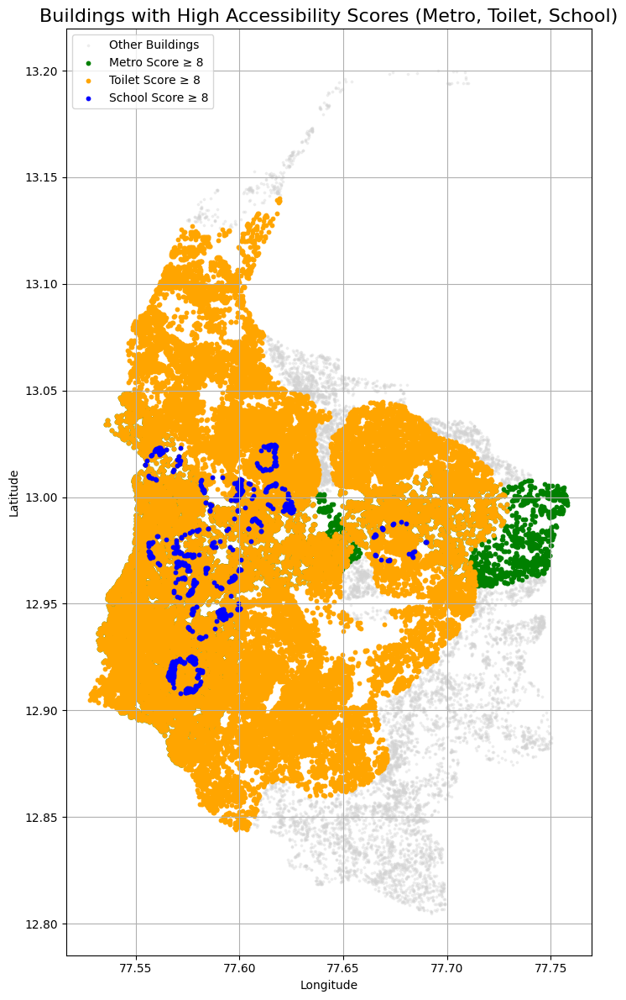

In [58]:
# Plot buildings with high scores for Metro, Toilet, and School facilities

# Define thresholds and styling for the three selected facilities
facility_thresholds = {
    "Metro_Score": {
        "color": "green", 
        "label": "Metro Score ≥ 8", 
        "threshold": 8
    },
    "Toilet_Score": {
        "color": "orange", 
        "label": "Toilet Score ≥ 8", 
        "threshold": 8
    },
    "School_Score": {
        "color": "blue", 
        "label": "School Score ≥ 8", 
        "threshold": 5
    }
}

# Initialize base map with all buildings in light gray
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

# Overlay buildings that meet the high-score threshold for each facility
for col, details in facility_thresholds.items():
    if col in residents_gdf.columns:
        high_score_buildings = residents_gdf[residents_gdf[col] >= details["threshold"]]
        high_score_buildings.plot(
            ax=ax, 
            color=details["color"], 
            markersize=10, 
            label=details["label"]
        )

# Final plot settings
plt.title("Buildings with High Accessibility Scores (Metro, Toilet, School)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
